In [ ]:
import pandas as pd
path = "/content/Healthcare_Associated_Infections-Hospital.csv"

In [ ]:
data = pd.read_csv(path)
data.head

<bound method NDFrame.head of        Facility ID                     Facility Name  \
0           010001   SOUTHEAST HEALTH MEDICAL CENTER   
1           010001   SOUTHEAST HEALTH MEDICAL CENTER   
2           010001   SOUTHEAST HEALTH MEDICAL CENTER   
3           010001   SOUTHEAST HEALTH MEDICAL CENTER   
4           010001   SOUTHEAST HEALTH MEDICAL CENTER   
...            ...                               ...   
173227      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173228      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173229      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173230      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173231      670319  TRINITY REGIONAL HOSPITAL SACHSE   

                                   Address City/Town State  ZIP Code  \
0                   1108 ROSS CLARK CIRCLE    DOTHAN    AL     36301   
1                   1108 ROSS CLARK CIRCLE    DOTHAN    AL     36301   
2                   1108 ROSS CLARK CIRCLE    DOTHAN    AL     36301   
3        

In [ ]:
data.shape

(173232, 15)

In [ ]:
data.isnull

<bound method DataFrame.isnull of        Facility ID                     Facility Name  \
0           010001   SOUTHEAST HEALTH MEDICAL CENTER   
1           010001   SOUTHEAST HEALTH MEDICAL CENTER   
2           010001   SOUTHEAST HEALTH MEDICAL CENTER   
3           010001   SOUTHEAST HEALTH MEDICAL CENTER   
4           010001   SOUTHEAST HEALTH MEDICAL CENTER   
...            ...                               ...   
173227      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173228      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173229      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173230      670319  TRINITY REGIONAL HOSPITAL SACHSE   
173231      670319  TRINITY REGIONAL HOSPITAL SACHSE   

                                   Address City/Town State  ZIP Code  \
0                   1108 ROSS CLARK CIRCLE    DOTHAN    AL     36301   
1                   1108 ROSS CLARK CIRCLE    DOTHAN    AL     36301   
2                   1108 ROSS CLARK CIRCLE    DOTHAN    AL     36301   
3    

In [ ]:
data.dropna(inplace = True)

In [ ]:
data.shape

(77773, 15)

In [ ]:
data.columns

Index(['Facility ID', 'Facility Name', 'Address', 'City/Town', 'State',
       'ZIP Code', 'County/Parish', 'Telephone Number', 'Measure ID',
       'Measure Name', 'Compared to National', 'Score', 'Footnote',
       'Start Date', 'End Date'],
      dtype='object')

In [ ]:
data.dtypes

Facility ID             object
Facility Name           object
Address                 object
City/Town               object
State                   object
ZIP Code                 int64
County/Parish           object
Telephone Number        object
Measure ID              object
Measure Name            object
Compared to National    object
Score                   object
Footnote                object
Start Date              object
End Date                object
dtype: object

In [ ]:
data.select_dtypes(include = 'int64')

,ZIP Code
18,36301
19,36301
23,36301
54,35957
55,35957
...,...
173227,75048
173228,75048
173229,75048
173230,75048


In [ ]:
data.select_dtypes(include = 'float64')

""
18
19
23
54
55
...
173227
173228
173229
173230


In [ ]:
data.describe()

,ZIP Code
count,77773.000000
mean,56383.219048
std,25692.988618
min,603.000000
25%,38464.000000
50%,58801.000000
75%,76048.000000
max,99929.000000


from matplotlib import pyplot as plt
_df_0['ZIP Code'].plot(kind='hist', bins=20, title='ZIP Code')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['ZIP Code'].plot(kind='line', figsize=(8, 4), title='ZIP Code')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77773 entries, 18 to 173231
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Facility ID           77773 non-null  object
 1   Facility Name         77773 non-null  object
 2   Address               77773 non-null  object
 3   City/Town             77773 non-null  object
 4   State                 77773 non-null  object
 5   ZIP Code              77773 non-null  int64 
 6   County/Parish         77773 non-null  object
 7   Telephone Number      77773 non-null  object
 8   Measure ID            77773 non-null  object
 9   Measure Name          77773 non-null  object
 10  Compared to National  77773 non-null  object
 11  Score                 77773 non-null  object
 12  Footnote              77773 non-null  object
 13  Start Date            77773 non-null  object
 14  End Date              77773 non-null  object
dtypes: int64(1), object(14)
memory usa

# **Convert Score**

In [ ]:
#Convert the Score to float value and coerce is used to handle the non-convertable values
data['Score'] = pd.to_numeric(data['Score'] , errors='coerce')
#Similarly for date
data['Start Date'] = pd.to_datetime(data['Start Date'] , errors = 'coerce')

In [ ]:
# Check for NaN values in 'Score' and 'Start Date' columns
nan_score_count = data['Score'].isna().sum()
nan_start_date_count = data['Start Date'].isna().sum()

print("Number of NaN values in 'Score' column:", nan_score_count)
print("Number of NaN values in 'Start Date' column:", nan_start_date_count)


Number of NaN values in 'Score' column: 75264
Number of NaN values in 'Start Date' column: 0


In [ ]:
from sklearn.impute import SimpleImputer

# Initialize SimpleImputer with strategy 'mean' to replace NaN values with the mean of the column
imputer = SimpleImputer(strategy='mean')

# Apply imputation to the 'Score' column
data['Score'] = imputer.fit_transform(data['Score'].values.reshape(-1, 1))

# Verify if there are any NaN values remaining
nan_score_count = data['Score'].isna().sum()
print("Number of NaN values in 'Score' column after imputation:", nan_score_count)


Number of NaN values in 'Score' column after imputation: 0


# **LINE CHART**

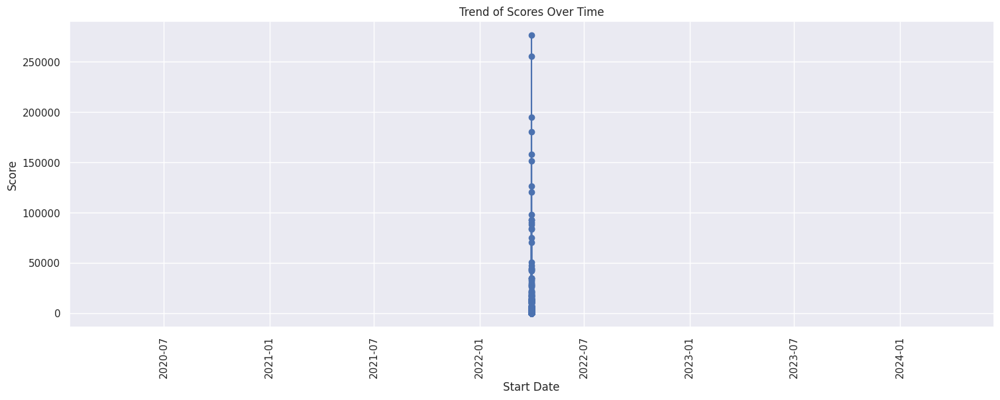

In [ ]:
plt.figure(figsize=(18, 6))
plt.plot(data['Start Date'], data['Score'], marker='o', linestyle='-')
plt.title('Trend of Scores Over Time')
plt.xlabel('Start Date')
plt.ylabel('Score')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

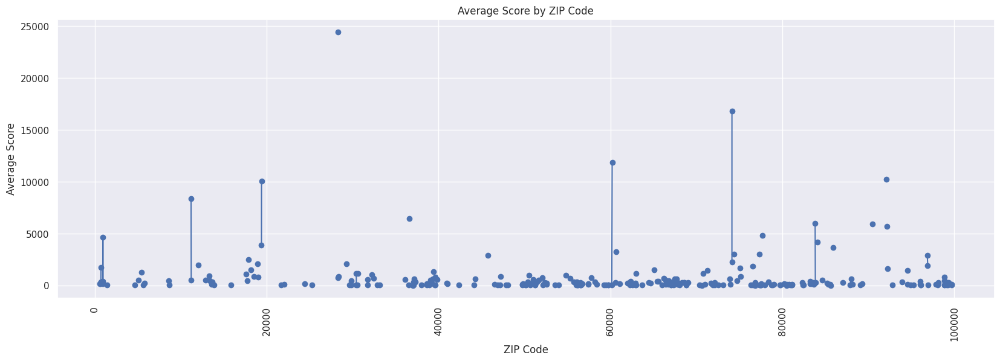

In [ ]:
zip_score_mean = data.groupby('ZIP Code')['Score'].mean().reset_index()

# Line chart for ZIP Code vs. Average Score
plt.figure(figsize=(20, 6))
plt.plot(zip_score_mean['ZIP Code'], zip_score_mean['Score'], marker='o', linestyle='-')
plt.title('Average Score by ZIP Code')
plt.xlabel('ZIP Code')
plt.ylabel('Average Score')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(True)  # Add gridlines for better visualization
plt.show()


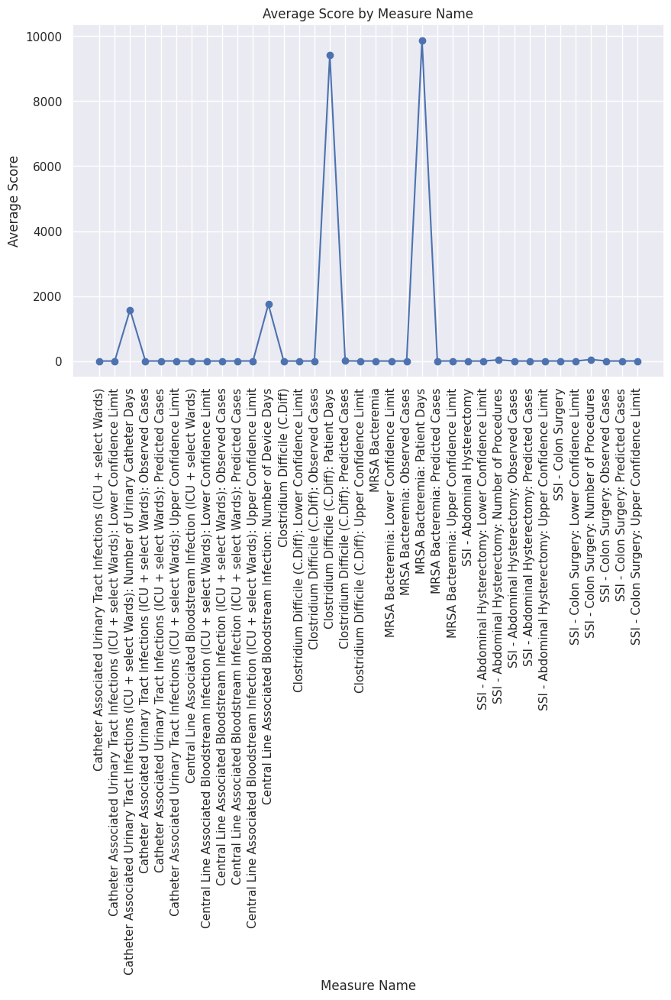

In [ ]:
measure_score_mean = data.groupby('Measure Name')['Score'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(measure_score_mean['Measure Name'], measure_score_mean['Score'], marker='o', linestyle='-')
plt.title('Average Score by Measure Name')
plt.xlabel('Measure Name')
plt.ylabel('Average Score')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

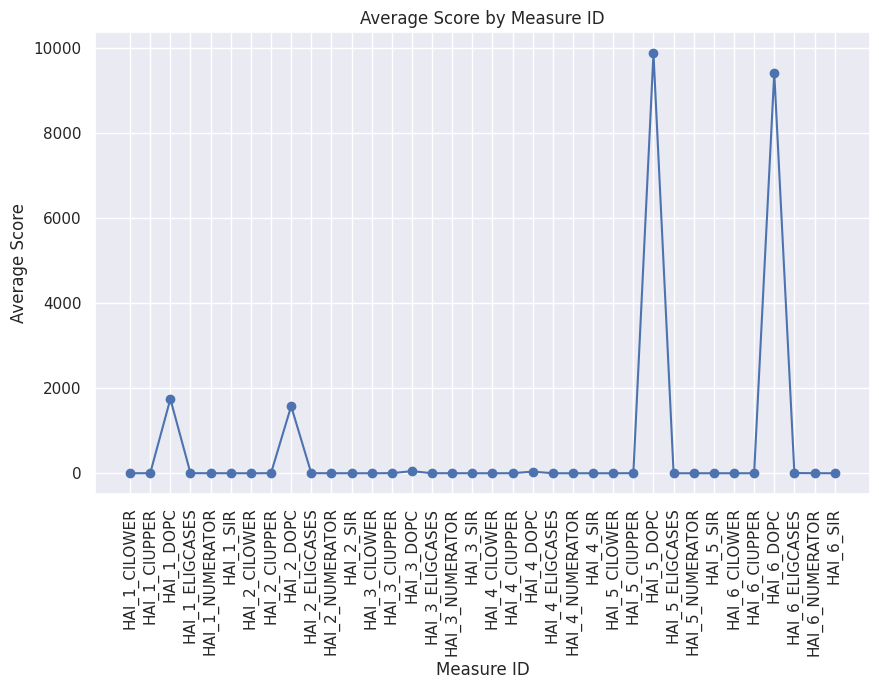

In [ ]:
measure_score_mean = data.groupby('Measure ID')['Score'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.plot(measure_score_mean['Measure ID'], measure_score_mean['Score'], marker='o', linestyle='-')
plt.title('Average Score by Measure ID')
plt.xlabel('Measure ID')
plt.ylabel('Average Score')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# **BAR PLOT**
USING MATPLOTLIB AND SEABORN

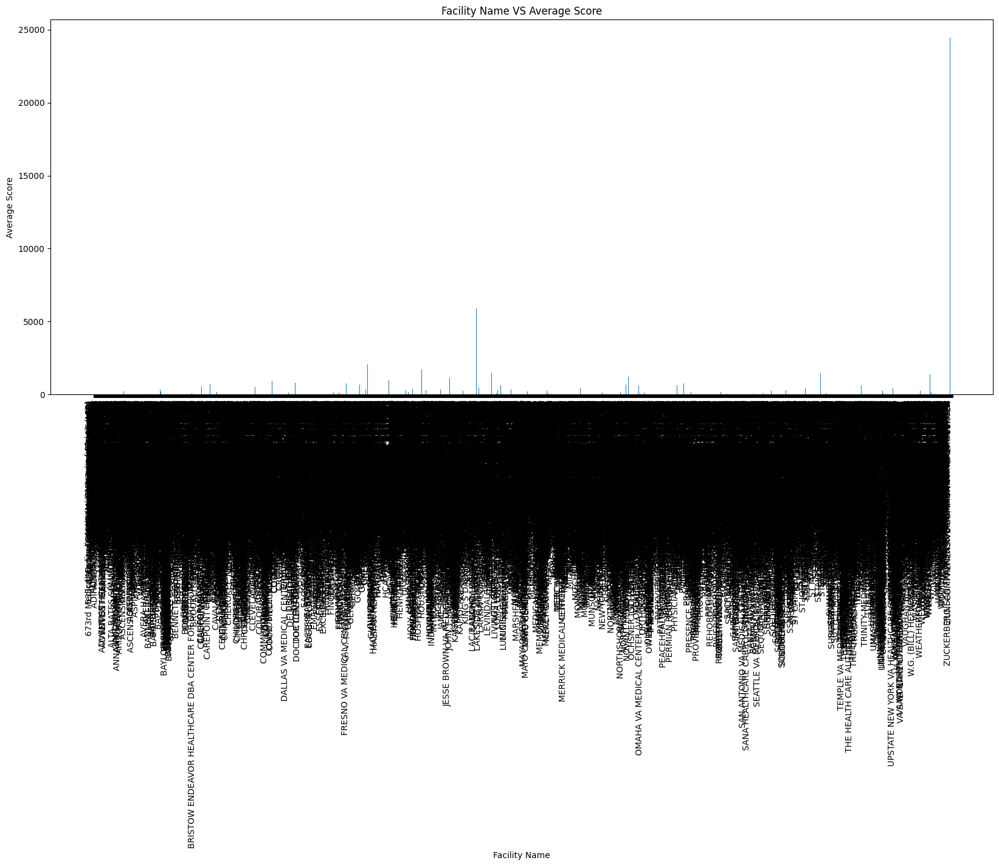

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
facility_score = data.groupby('Facility Name')['Score'].mean()
plt.figure(figsize = (20 , 8))
plt.bar(facility_score.index , facility_score.values)
plt.xlabel('Facility Name')
plt.ylabel('Average Score')
plt.title('Facility Name VS Average Score')
plt.xticks(rotation = 90 , ha = 'right')
plt.show()

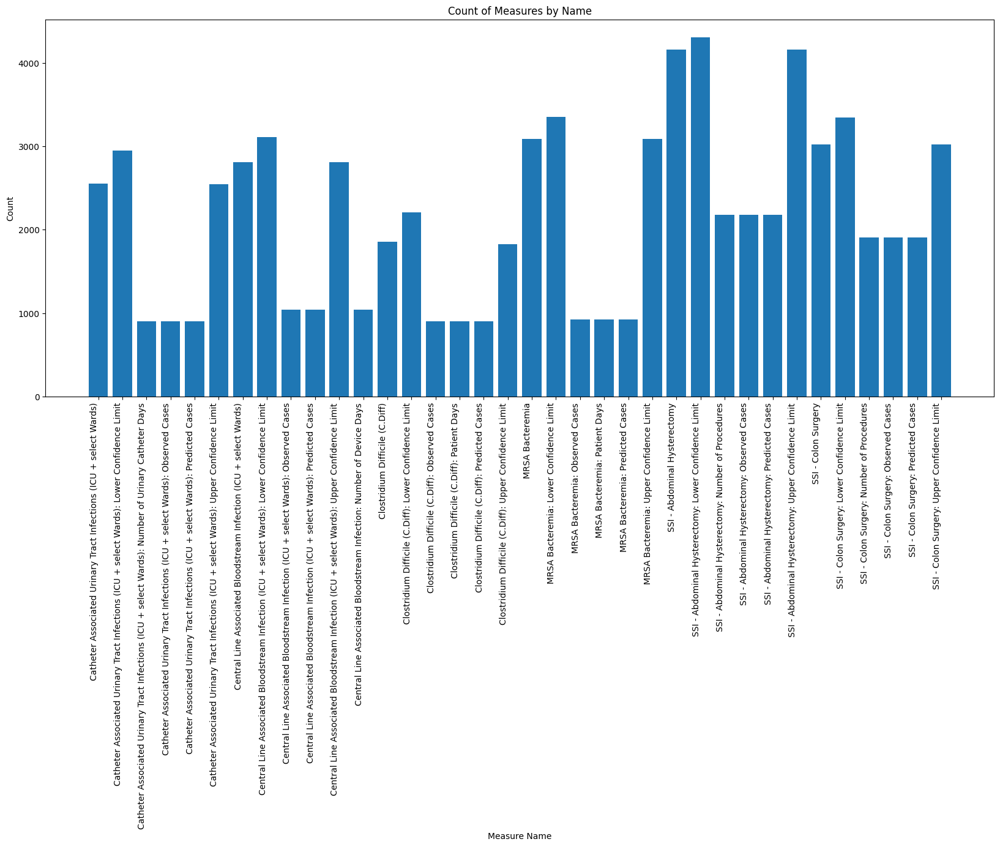

In [ ]:
measure_count = data.groupby('Measure Name').size().reset_index(name = 'Count')
plt.figure(figsize = (20 , 8))
plt.bar(measure_count["Measure Name"], measure_count["Count"])
plt.xlabel("Measure Name")
plt.ylabel("Count")
plt.title("Count of Measures by Name")
plt.xticks(rotation = 90 , ha = 'right')
plt.show()

<ipython-input-25-669ce6c8ebe8>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Measure Name", y = "Count", data=data.groupby("Measure Name").size().reset_index(name="Count") , palette='Paired' , legend = True)


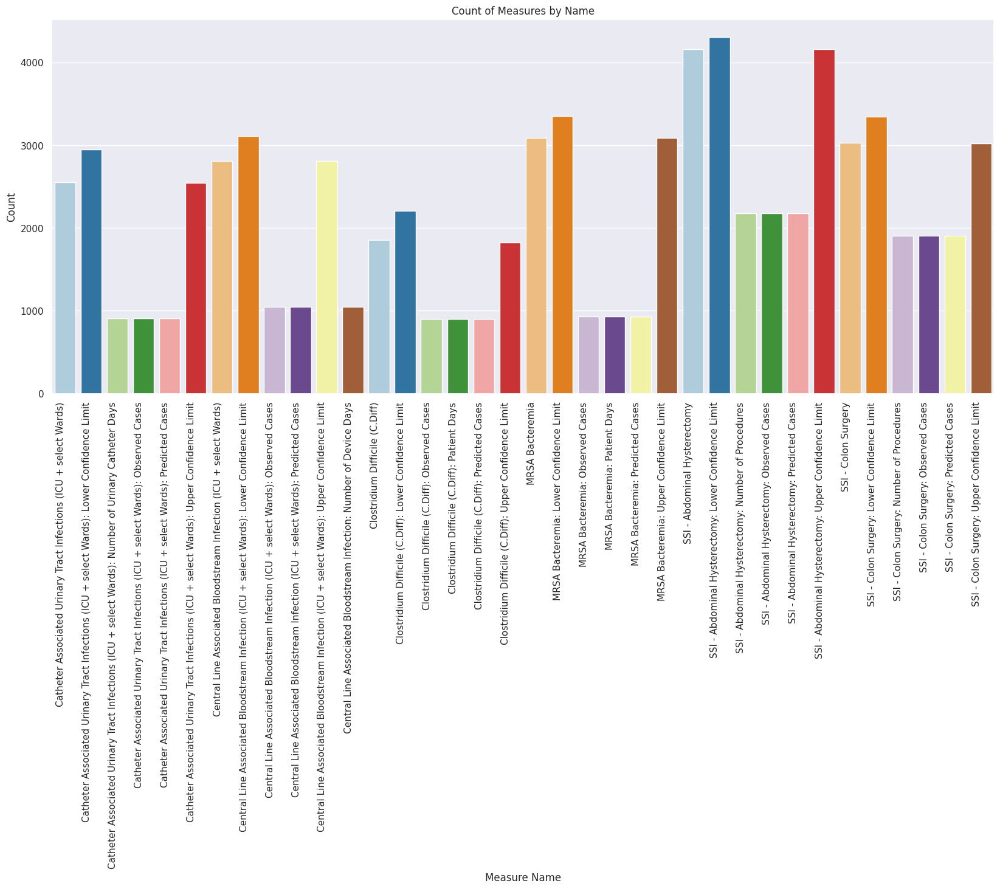

In [ ]:
plt.figure(figsize = (20 , 8))
sns.barplot(x="Measure Name", y = "Count", data=data.groupby("Measure Name").size().reset_index(name="Count") , palette='Paired' , legend = True)
plt.title("Count of Measures by Name")
plt.xticks(rotation = 90 , ha = 'right')
plt.show()

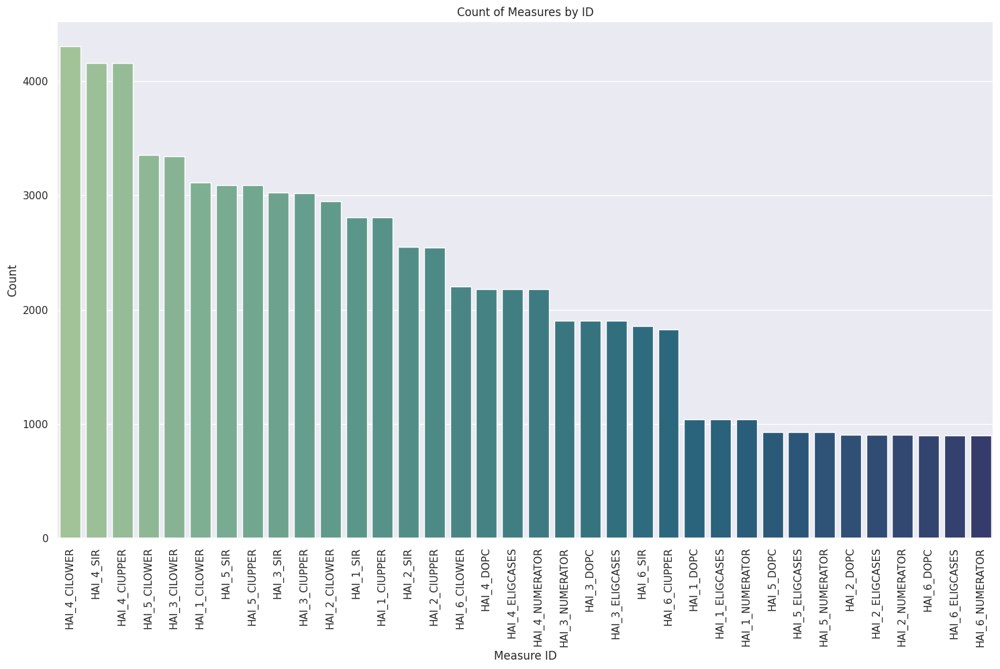

In [ ]:
plt.figure(figsize = (18 , 10))
sns.set_theme()
sns.barplot(x=data['Measure ID'].value_counts().index, y=data['Measure ID'].value_counts().values, hue=data['Measure ID'].value_counts().index, palette='crest', legend=False)
plt.title("Count of Measures by ID")
plt.xlabel("Measure ID")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

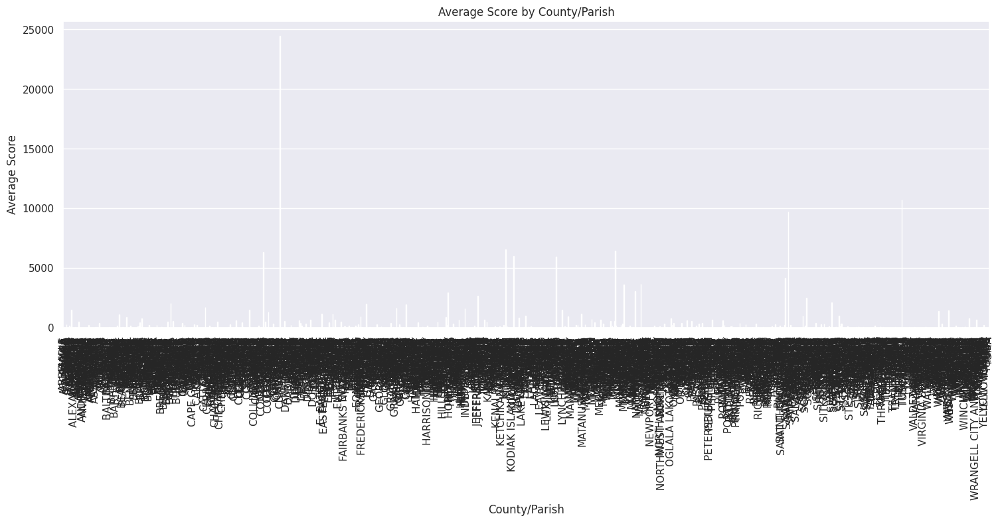

In [ ]:
county_score_mean = data.groupby('County/Parish')['Score'].mean().reset_index()
plt.figure(figsize=(18, 6))
sns.barplot(x='County/Parish', y='Score', hue='County/Parish', palette='magma', data=county_score_mean)
plt.title('Average Score by County/Parish')
plt.xlabel('County/Parish')
plt.ylabel('Average Score')
plt.xticks(rotation=90)
plt.show()

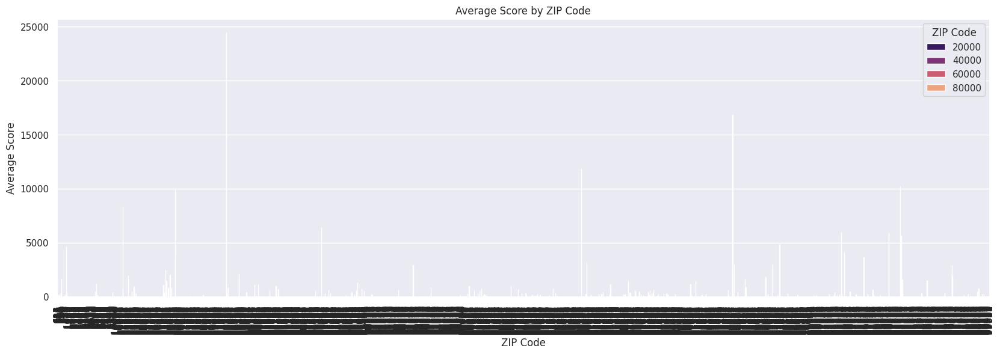

In [ ]:
zipcode_score_mean = data.groupby('ZIP Code')['Score'].mean().reset_index()
plt.figure(figsize=(20, 6))
sns.barplot(x='ZIP Code', y='Score', hue='ZIP Code', palette='magma', data=zipcode_score_mean)
plt.title('Average Score by ZIP Code')
plt.xlabel('ZIP Code')
plt.ylabel('Average Score')
plt.xticks(rotation=90)
plt.legend(title='ZIP Code', loc='upper right')
plt.show()

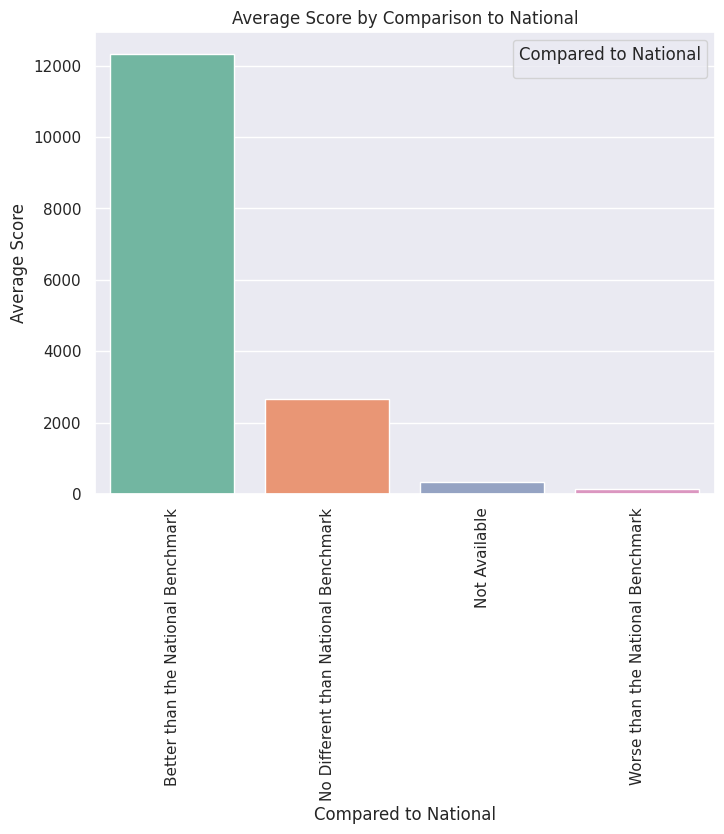

In [ ]:
compared_to_national_score_mean = data.groupby('Compared to National')['Score'].mean().reset_index()

plt.figure(figsize=(8, 6))
sns.barplot(x='Compared to National', y='Score', hue='Compared to National', palette='Set2', data=compared_to_national_score_mean)
plt.title('Average Score by Comparison to National')
plt.xlabel('Compared to National')
plt.ylabel('Average Score')
plt.xticks(rotation=90)
plt.legend(title='Compared to National', loc='upper right')
plt.show()

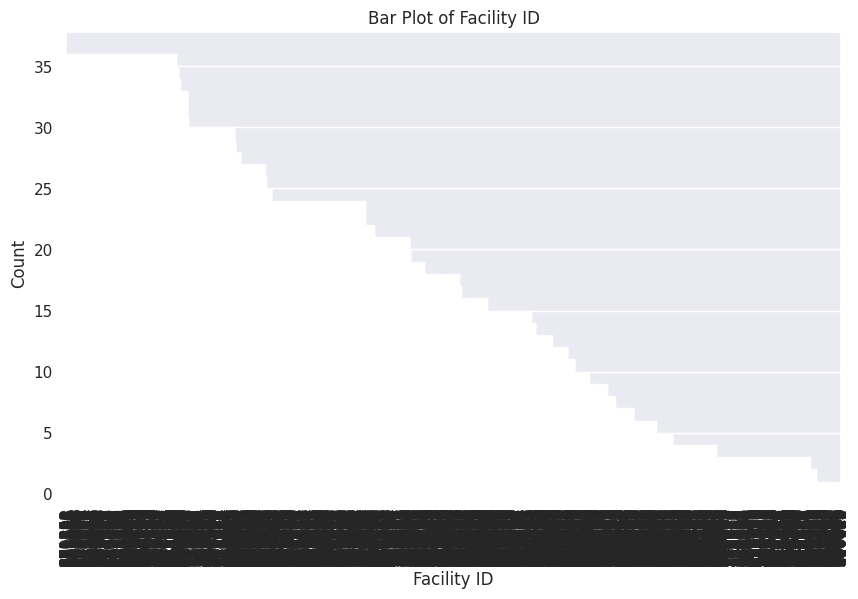

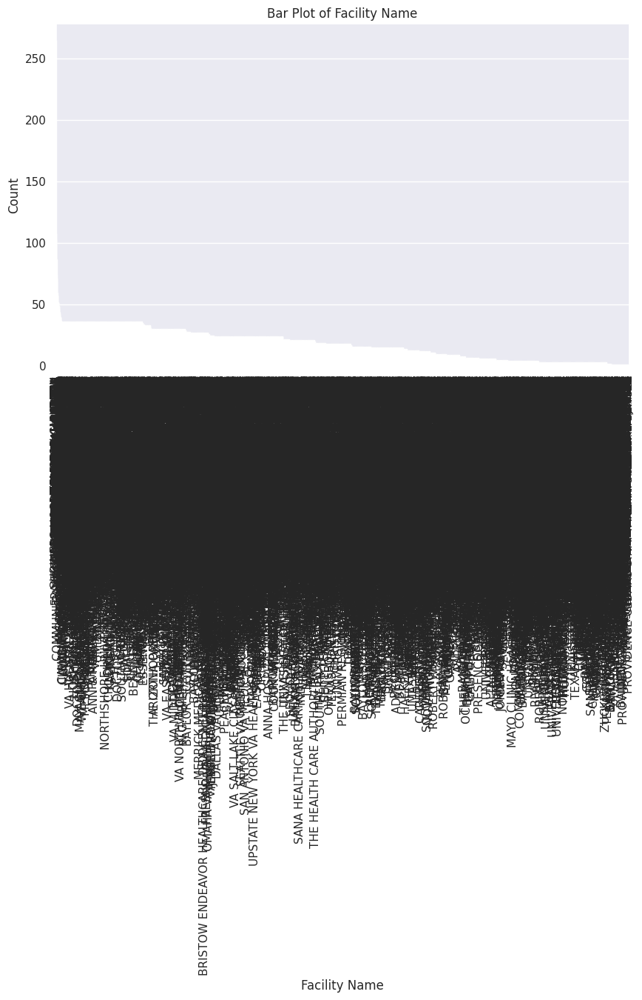

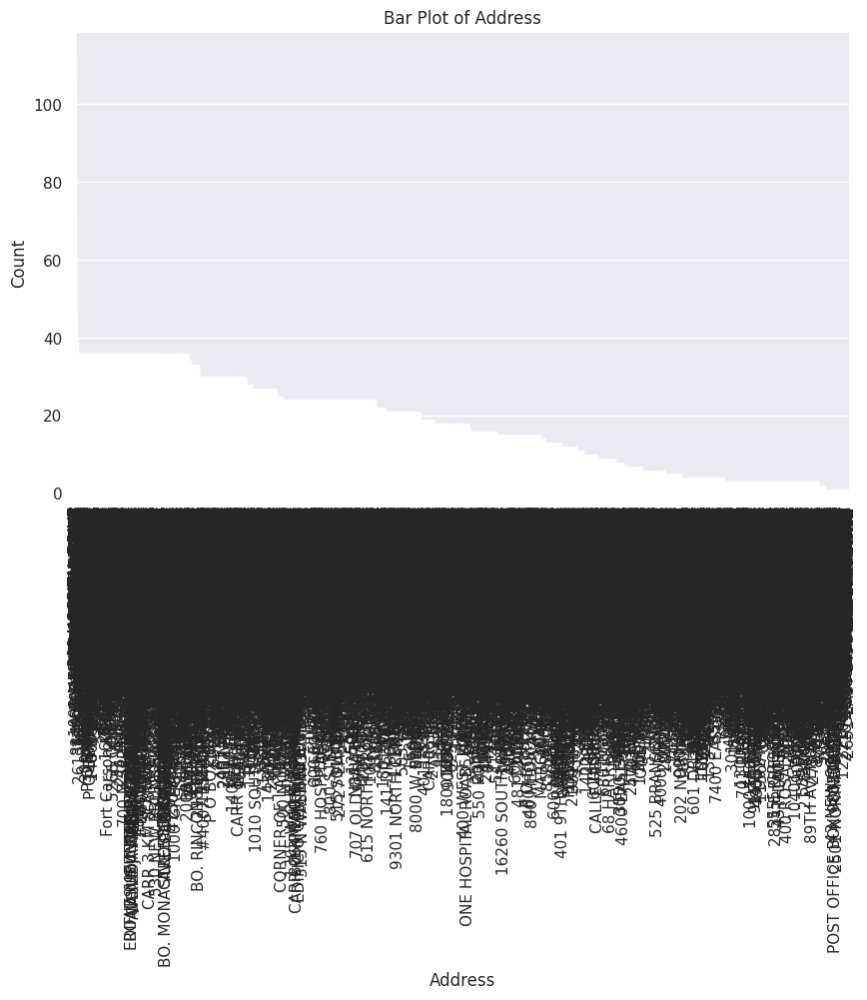

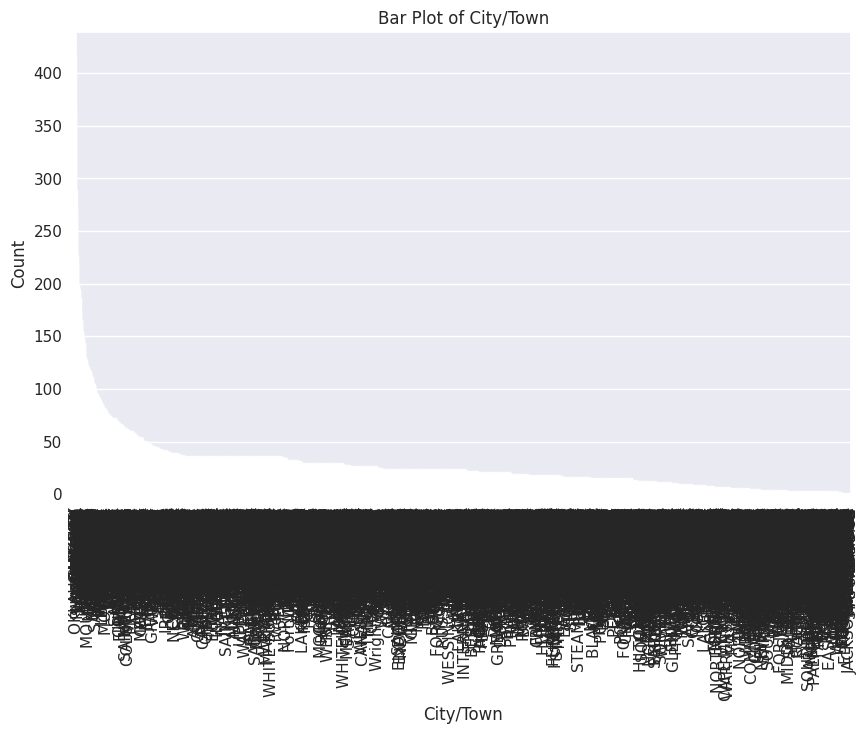

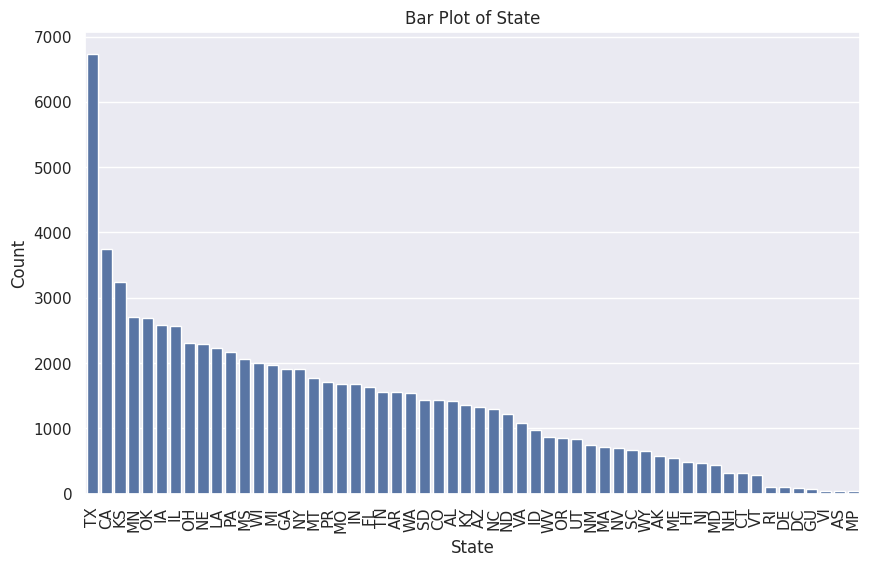

...

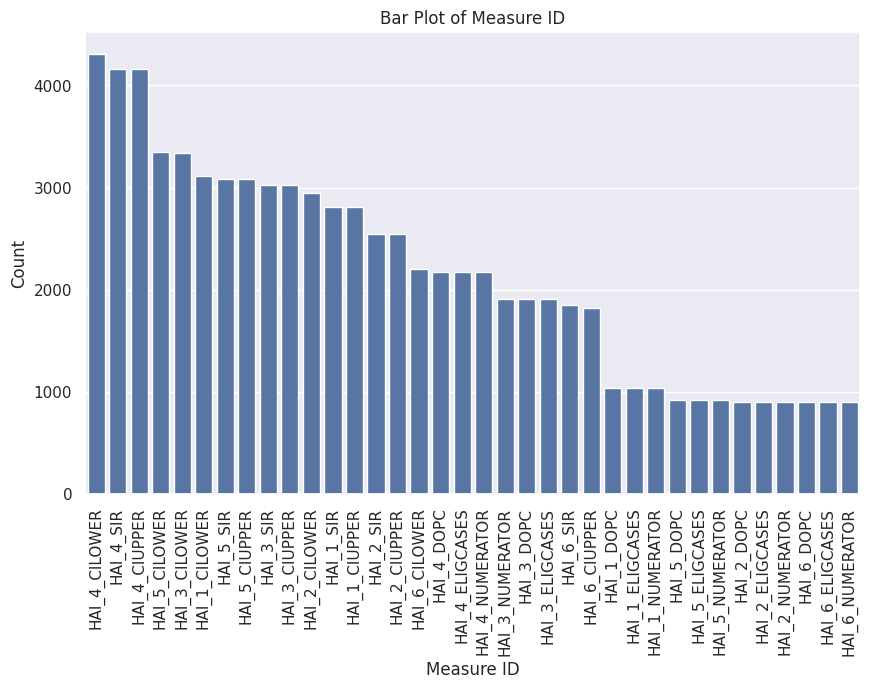

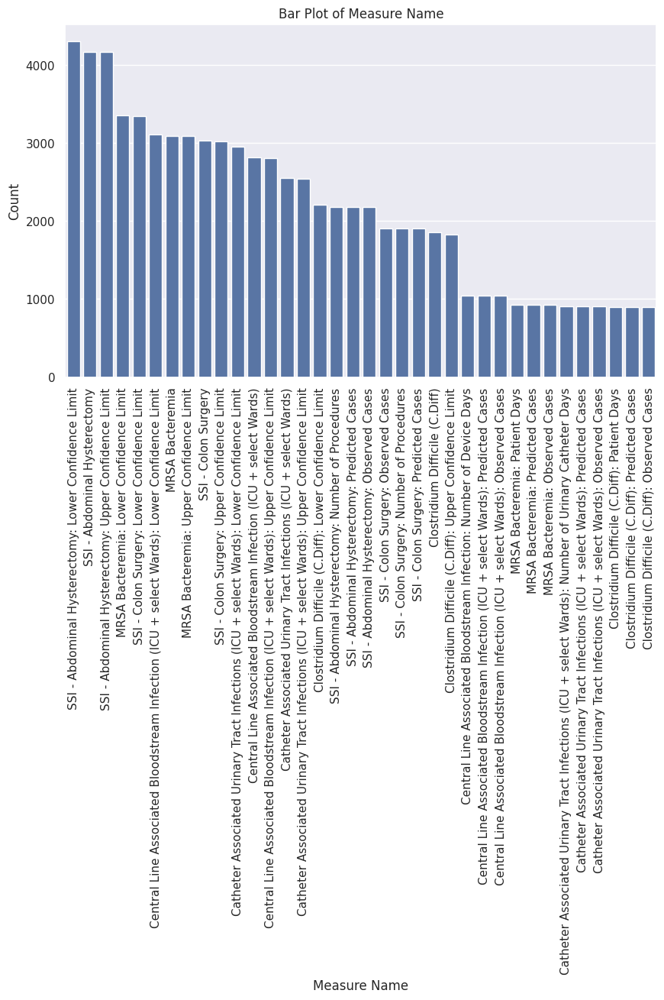

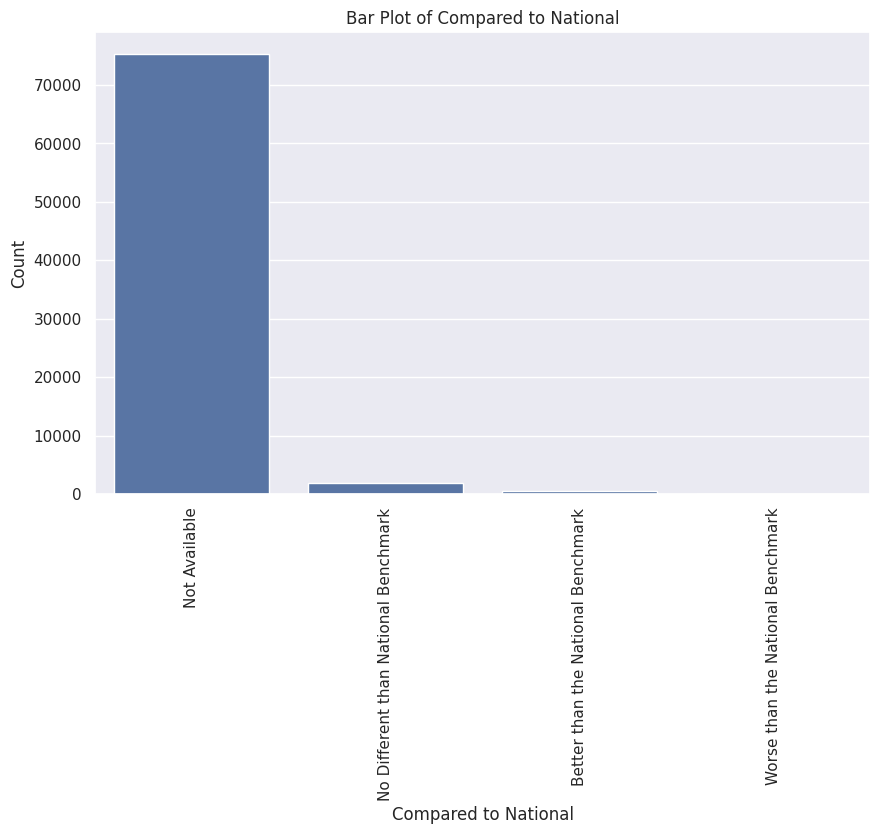

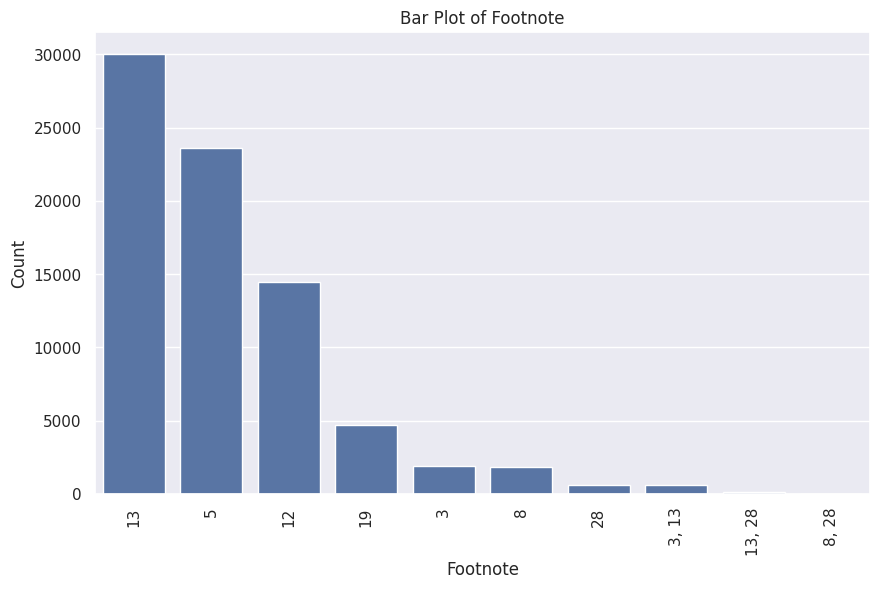

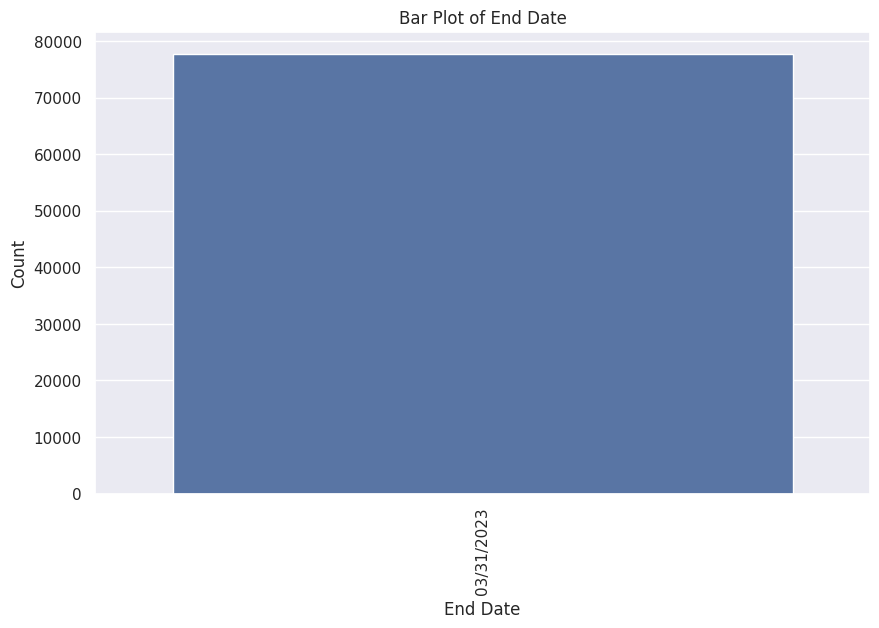

In [ ]:
for column in data.columns:
    if data[column].dtype == 'object':
        value_counts = data[column].value_counts()

        # Plotting bar plot for the current column
        plt.figure(figsize=(10, 6))
        sns.barplot(x=value_counts.index, y=value_counts.values , color = '#59B4C3')
        plt.title(f'Bar Plot of {column}')
        plt.xlabel(column)
        plt.ylabel('Count')
        plt.xticks(rotation=90)
        plt.show()

# **BOX PLOT**

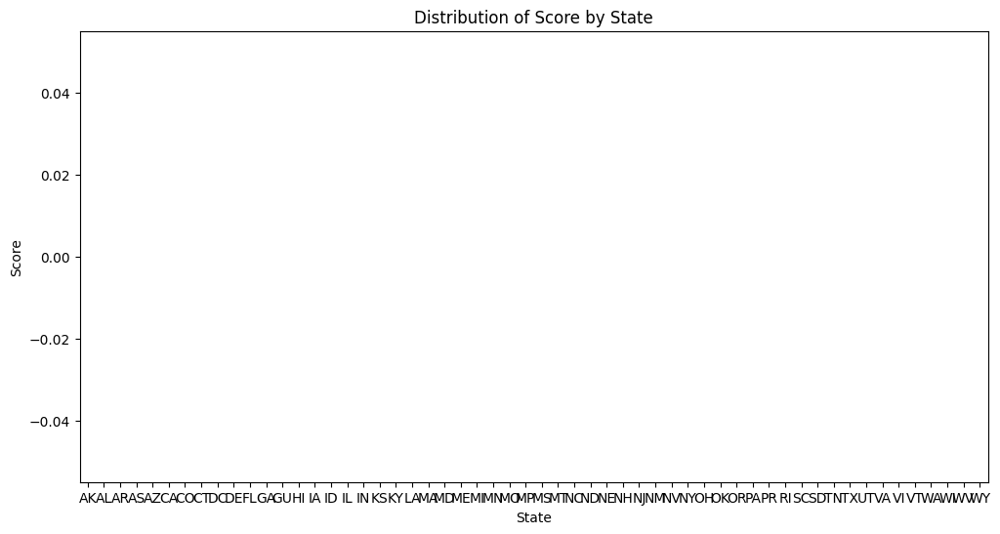

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 6))
state_scores = data.groupby('State')['Score'].apply(list).reset_index()
plt.boxplot(state_scores['Score'], labels=state_scores['State'], notch=True)
plt.xlabel("State")
plt.ylabel("Score")
plt.title("Distribution of Score by State")
plt.show()


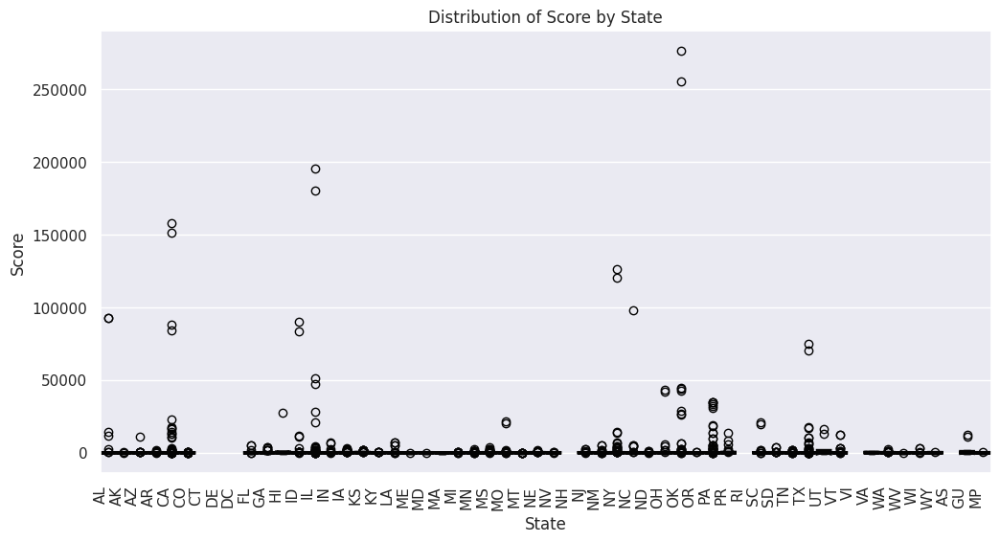

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='State', y='Score', data=data, palette='magma', hue='State', linewidth=2.5, notch=True)
plt.xlabel("State")
plt.ylabel("Score")
plt.title("Distribution of Score by State")
plt.xticks(rotation = 90 , ha = 'right')
plt.show()

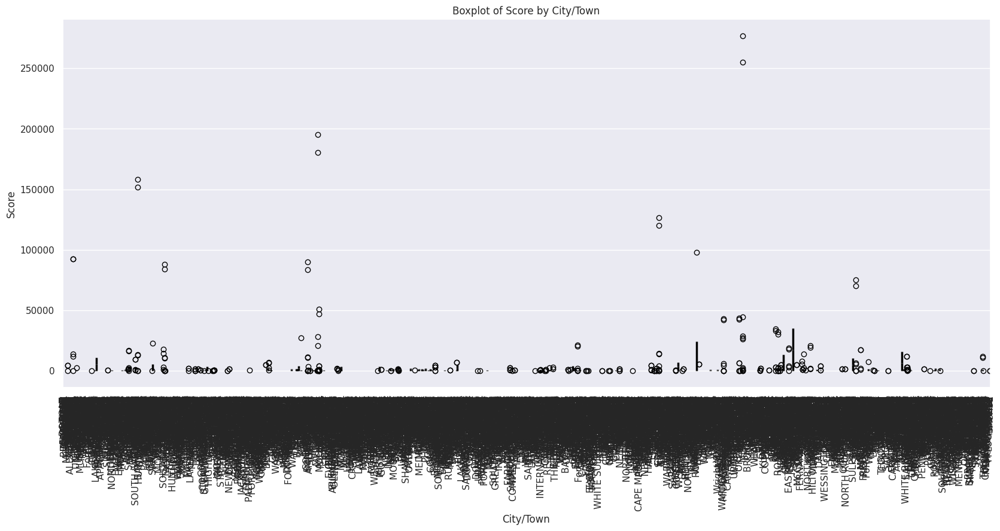

In [ ]:
plt.figure(figsize=(20, 8))
sns.boxplot(x='City/Town', y='Score', data=data , palette='magma', hue='State', linewidth=2.5 , legend = False)
plt.title('Boxplot of Score by City/Town')
plt.xlabel('City/Town')
plt.ylabel('Score')
plt.xticks(rotation = 90)
plt.show()

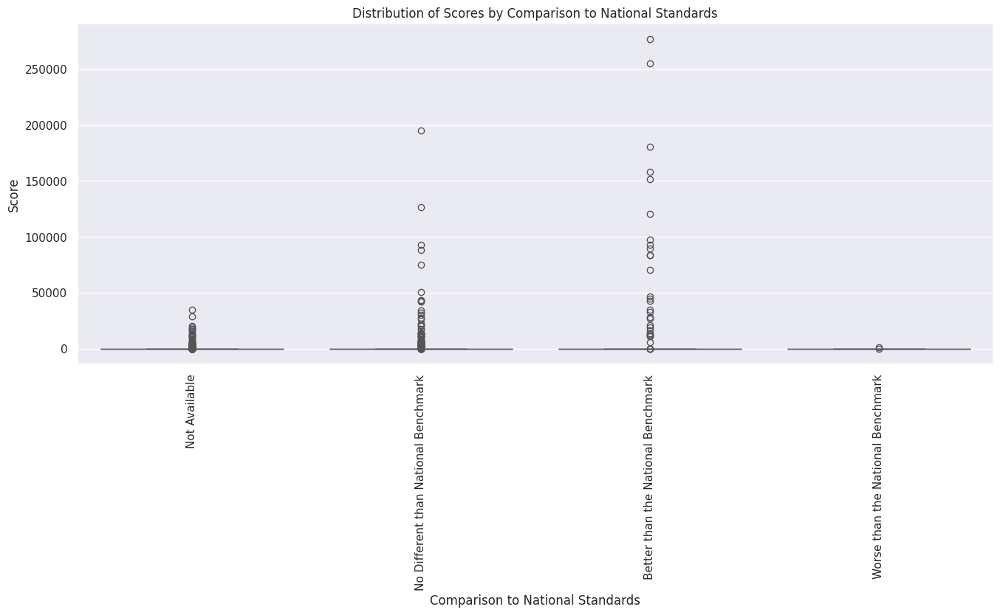

In [ ]:
plt.figure(figsize=(16, 6))
sns.boxplot(x='Compared to National', y='Score', data=data , color = '#59B4C3')
plt.title('Distribution of Scores by Comparison to National Standards')
plt.xlabel('Comparison to National Standards')
plt.ylabel('Score')
plt.xticks(rotation = 90)
plt.show()

# **VIOLIN PLOT**


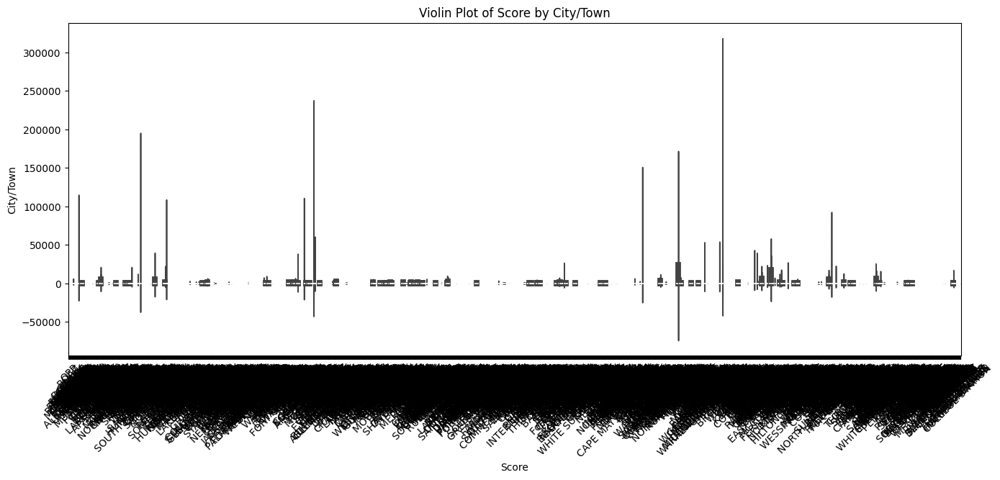

In [ ]:
plt.figure(figsize=(16, 6))
sns.violinplot(x='City/Town', y='Score', data=data, hue='City/Town', palette='vlag', legend=False)
plt.title('Violin Plot of Score by City/Town')
plt.xlabel('Score')
plt.ylabel('City/Town')
plt.xticks(rotation=45)
plt.show()

<ipython-input-43-41db75714b11>:3: UserWarning: 
The palette list has fewer values (6) than needed (56) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(x='State', y='Score', data=data ,hue ='State' , palette = colors , legend = False)


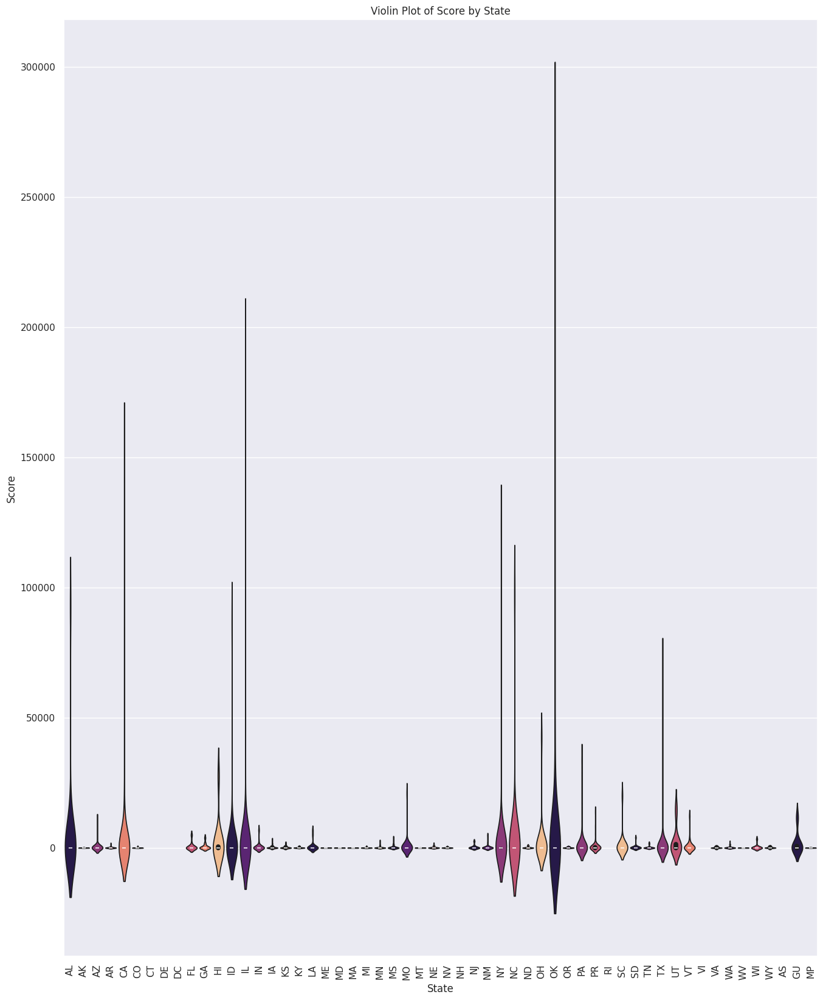

In [ ]:
colors = sns.color_palette("magma")
plt.figure(figsize=(16, 20))
sns.violinplot(x='State', y='Score', data=data ,hue ='State' , palette = colors , legend = False)
plt.title('Violin Plot of Score by State')
plt.xlabel('State')
plt.ylabel('Score')
plt.xticks(rotation= 90 )
plt.show()

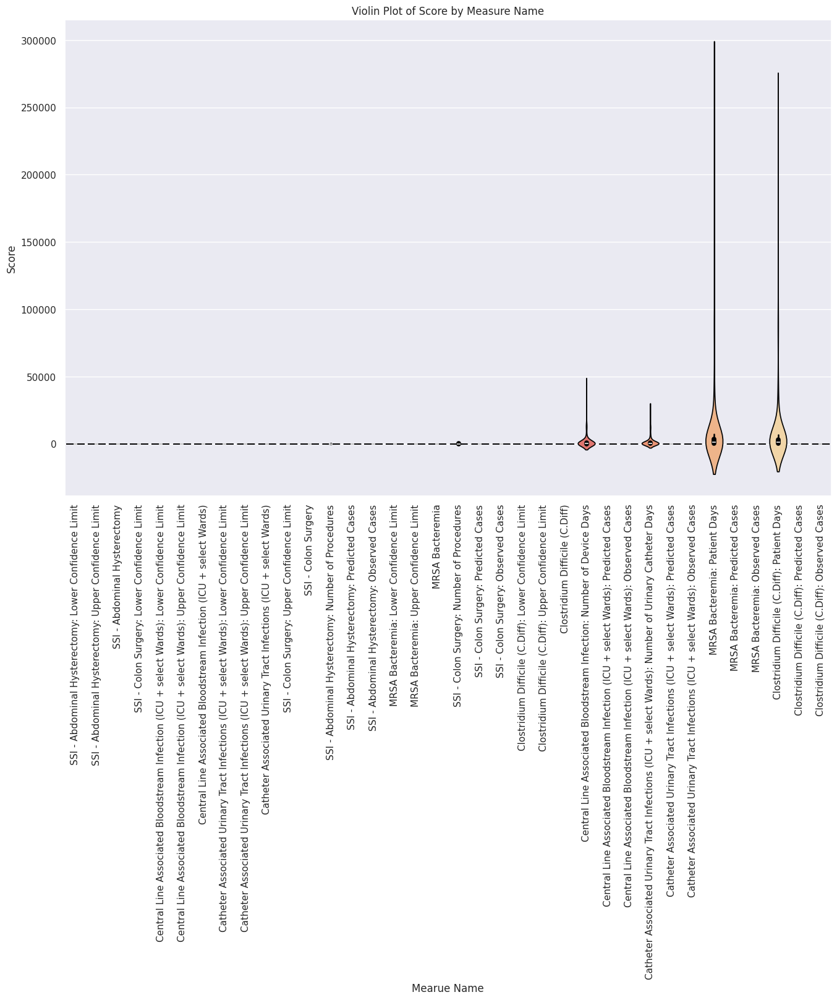

In [ ]:
plt.figure(figsize=(16, 10))
sns.violinplot(x='Measure Name', y='Score', data=data ,hue ='Measure Name' , palette = 'magma' , legend = False)
plt.title('Violin Plot of Score by Measure Name')
plt.xlabel('Mearue Name')
plt.ylabel('Score')
plt.xticks(rotation= 90 )
plt.show()

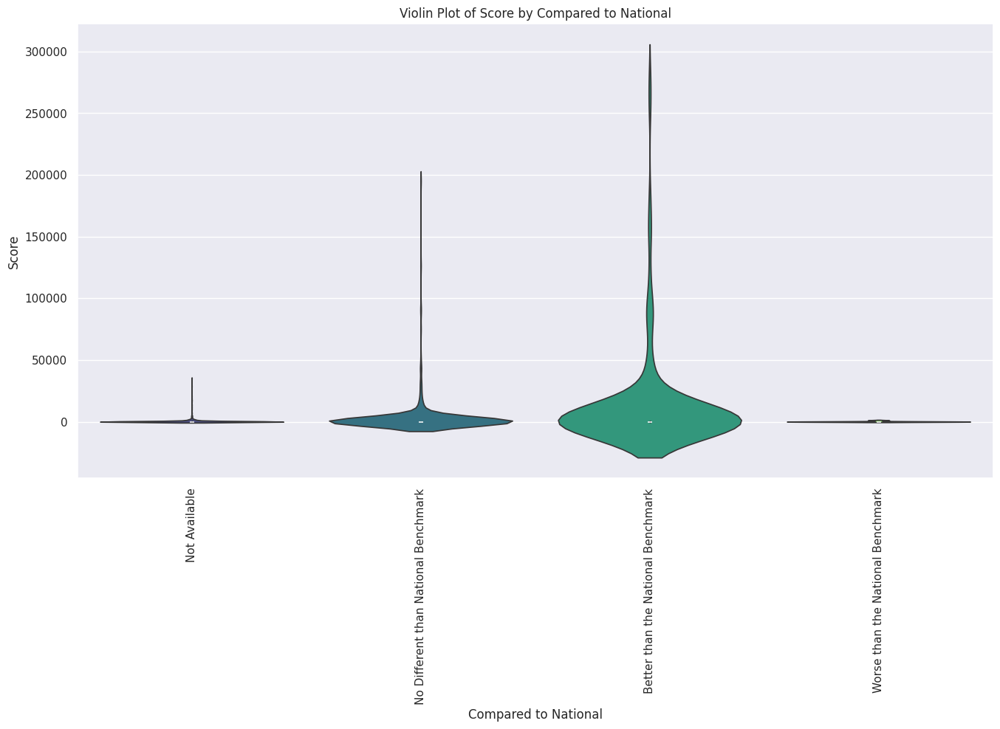

In [ ]:
plt.figure(figsize=(16, 8))
sns.violinplot(x='Compared to National', y='Score', data=data ,hue ='Compared to National' , palette = 'viridis' , legend = False)
plt.title('Violin Plot of Score by Compared to National')
plt.xlabel('Compared to National')
plt.ylabel('Score')
plt.xticks(rotation= 90 )
plt.show()

# **COUNT PLOT**

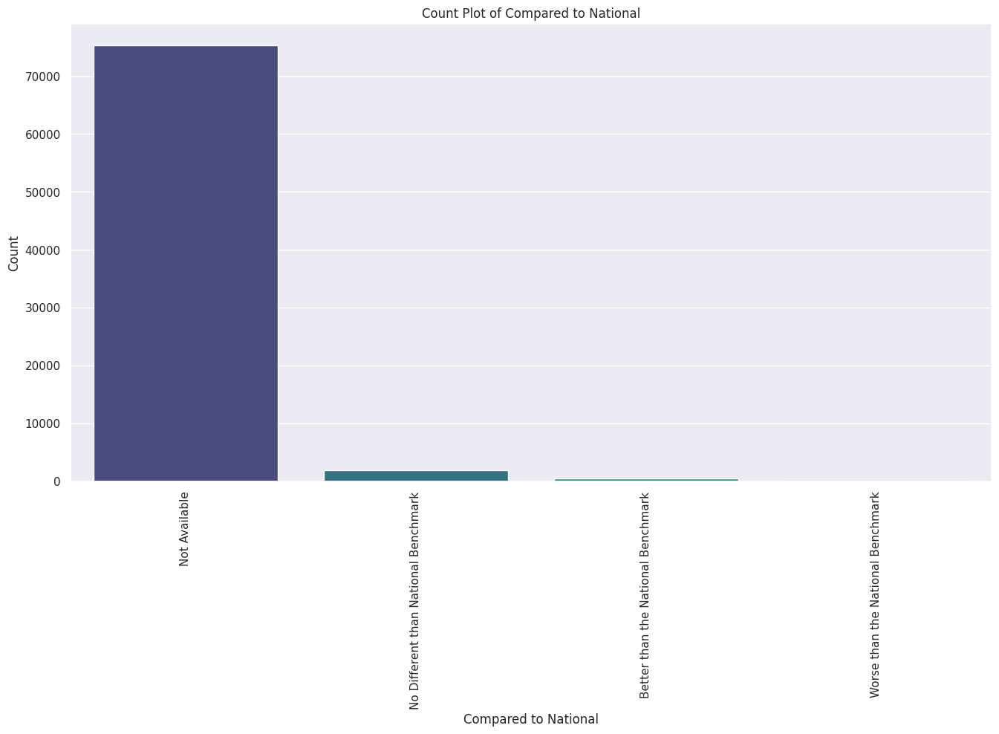

In [ ]:
plt.figure(figsize=(16, 8))
sns.countplot(x='Compared to National',  data=data ,hue ='Compared to National' , palette = 'viridis' , legend = False)
plt.title('Count Plot of Compared to National')
plt.xlabel('Compared to National')
plt.ylabel('Count')
plt.xticks(rotation= 90 )
plt.show()

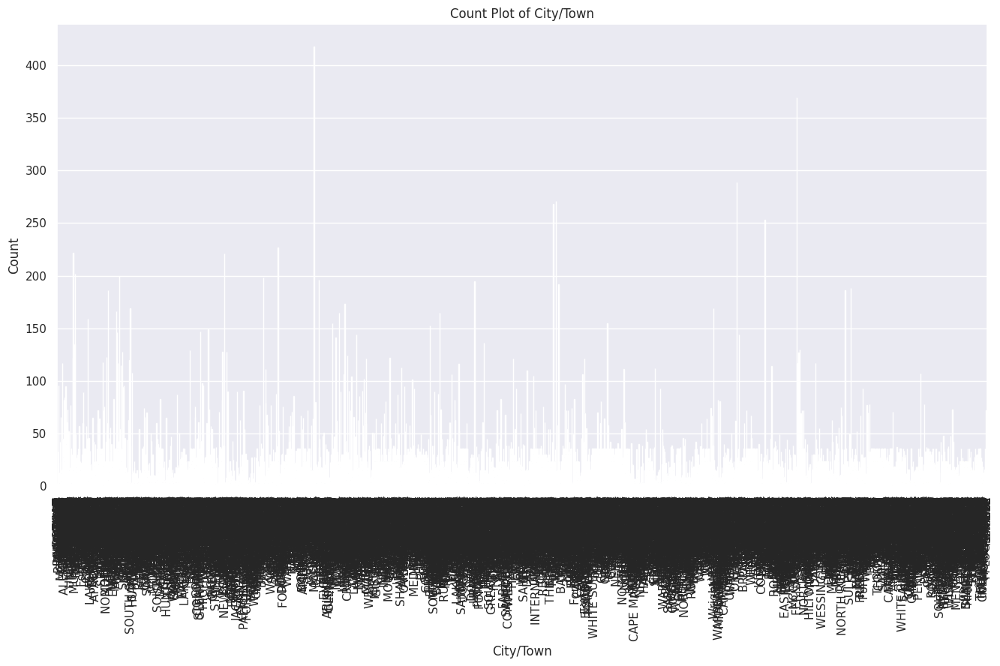

In [ ]:
plt.figure(figsize=(16, 8))
sns.countplot(x='City/Town',  data=data ,hue ='City/Town' , palette = 'viridis' , legend = False)
plt.title('Count Plot of City/Town')
plt.xlabel('City/Town')
plt.ylabel('Count')
plt.xticks(rotation= 90 )
plt.show()

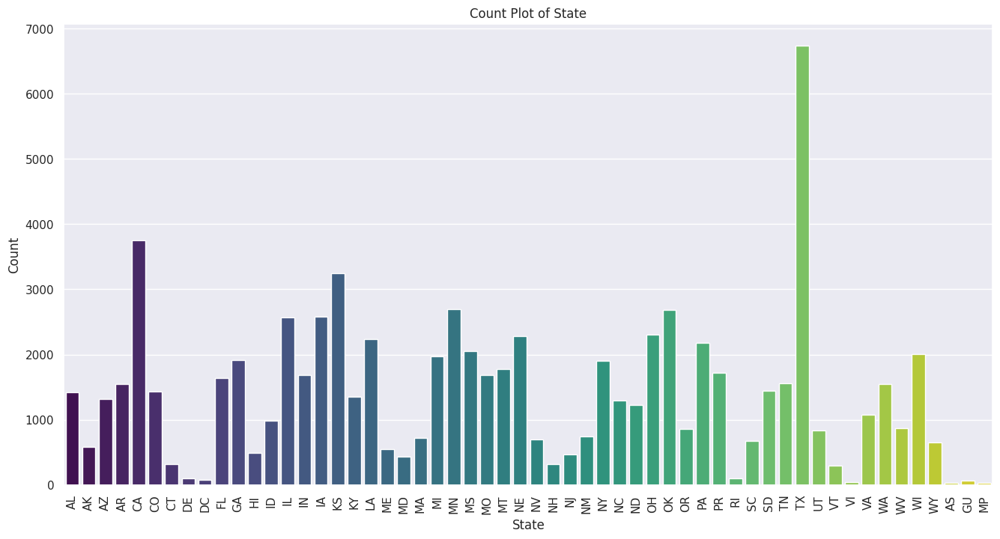

In [ ]:
plt.figure(figsize=(16, 8))
sns.countplot(x='State',  data=data ,hue ='State' , palette = 'viridis' , legend = False)
plt.title('Count Plot of State')
plt.xlabel('State')
plt.ylabel('Count')
plt.xticks(rotation= 90 )
plt.show()

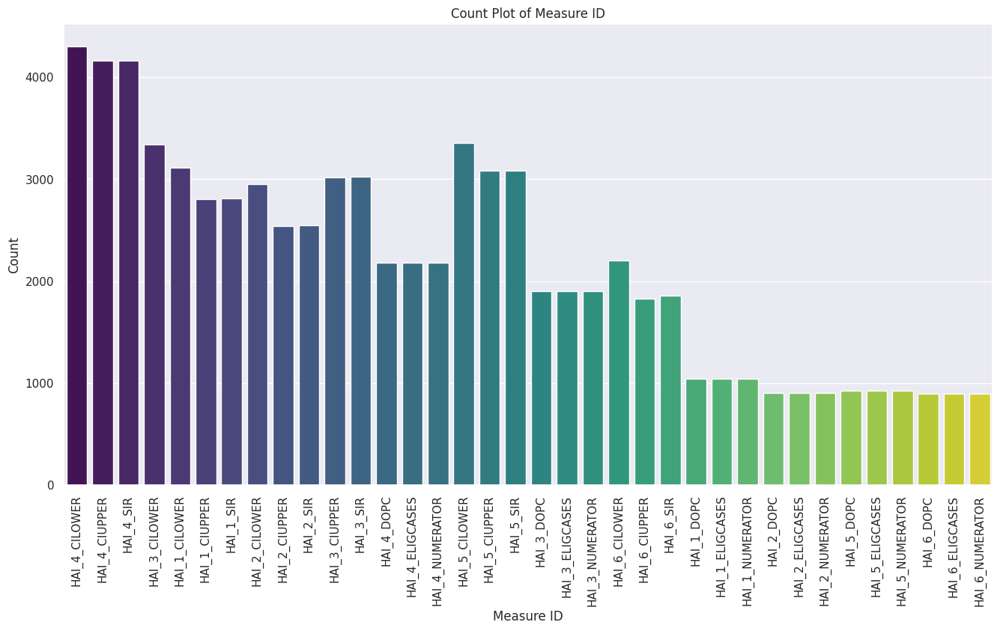

In [ ]:
plt.figure(figsize=(16, 8))
sns.countplot(x='Measure ID',  data=data ,hue ='Measure ID' , palette = 'viridis' , legend = False)
plt.title('Count Plot of Measure ID')
plt.xlabel('Measure ID')
plt.ylabel('Count')
plt.xticks(rotation= 90 )
plt.show()

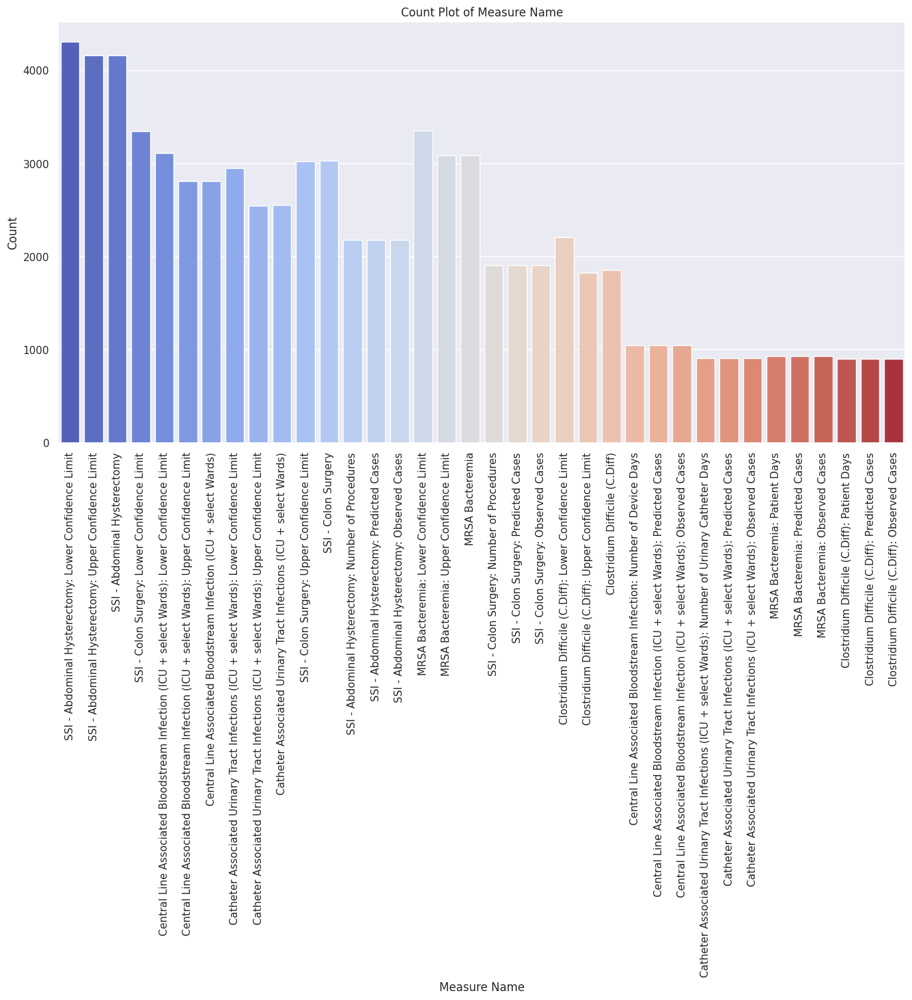

In [ ]:
plt.figure(figsize=(16, 8))
sns.countplot(x='Measure Name',  data=data ,hue ='Measure Name' , palette = 'coolwarm' , legend = False)
plt.title('Count Plot of Measure Name')
plt.xlabel('Measure Name')
plt.ylabel('Count')
plt.xticks(rotation= 90 )
plt.show()

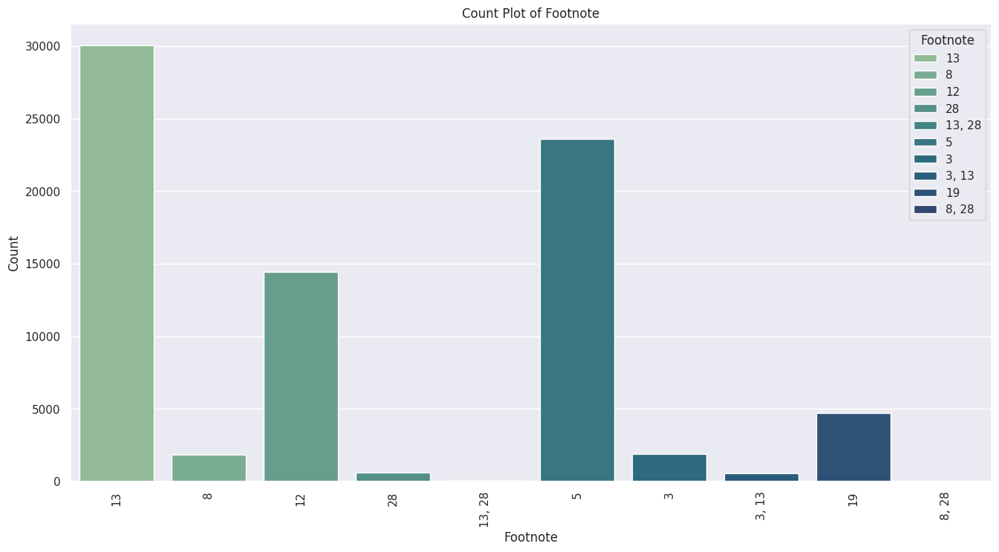

In [ ]:
plt.figure(figsize=(16, 8))
sns.countplot(x='Footnote',  data=data ,hue ='Footnote' , palette = 'crest' , legend = True)
plt.title('Count Plot of Footnote')
plt.xlabel('Footnote')
plt.ylabel('Count')
plt.xticks(rotation= 90 )
plt.show()

# **SCATTER PLOT**

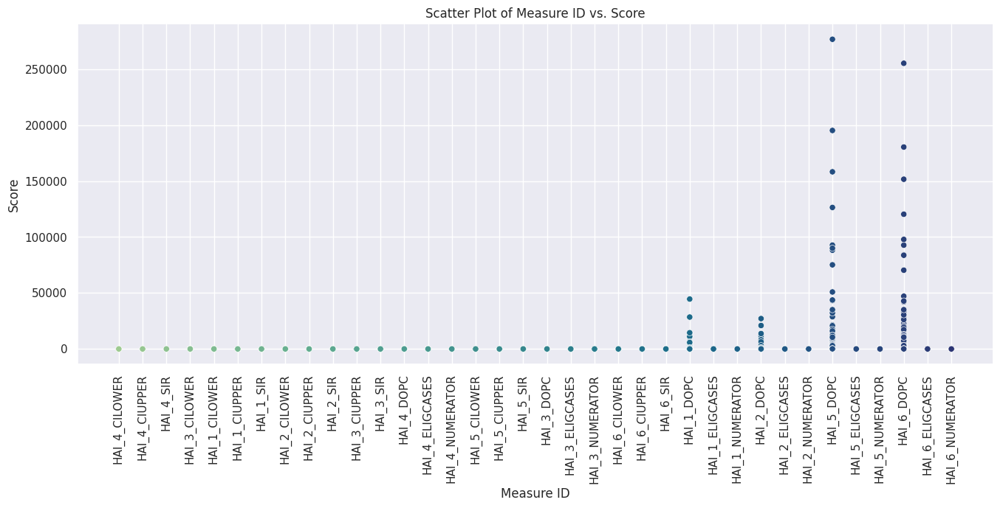

In [ ]:
plt.figure(figsize=(16, 6))
sns.scatterplot(x='Measure ID', y='Score', data = data , hue ='Measure ID' , palette = 'crest' , legend = False)
plt.title('Scatter Plot of Measure ID vs. Score')
plt.xlabel('Measure ID')
plt.ylabel('Score')
plt.xticks(rotation = 90)
plt.show()

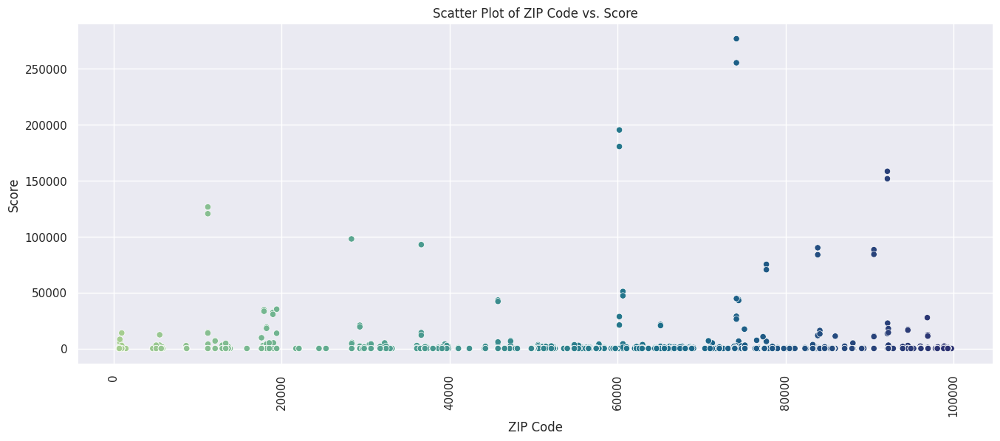

In [ ]:
plt.figure(figsize=(16, 6))
sns.scatterplot(x='ZIP Code', y='Score', data = data , hue ='ZIP Code' , palette = 'crest' , legend = False)
plt.title('Scatter Plot of ZIP Code vs. Score')
plt.xlabel('ZIP Code')
plt.ylabel('Score')
plt.xticks(rotation = 90)
plt.show()

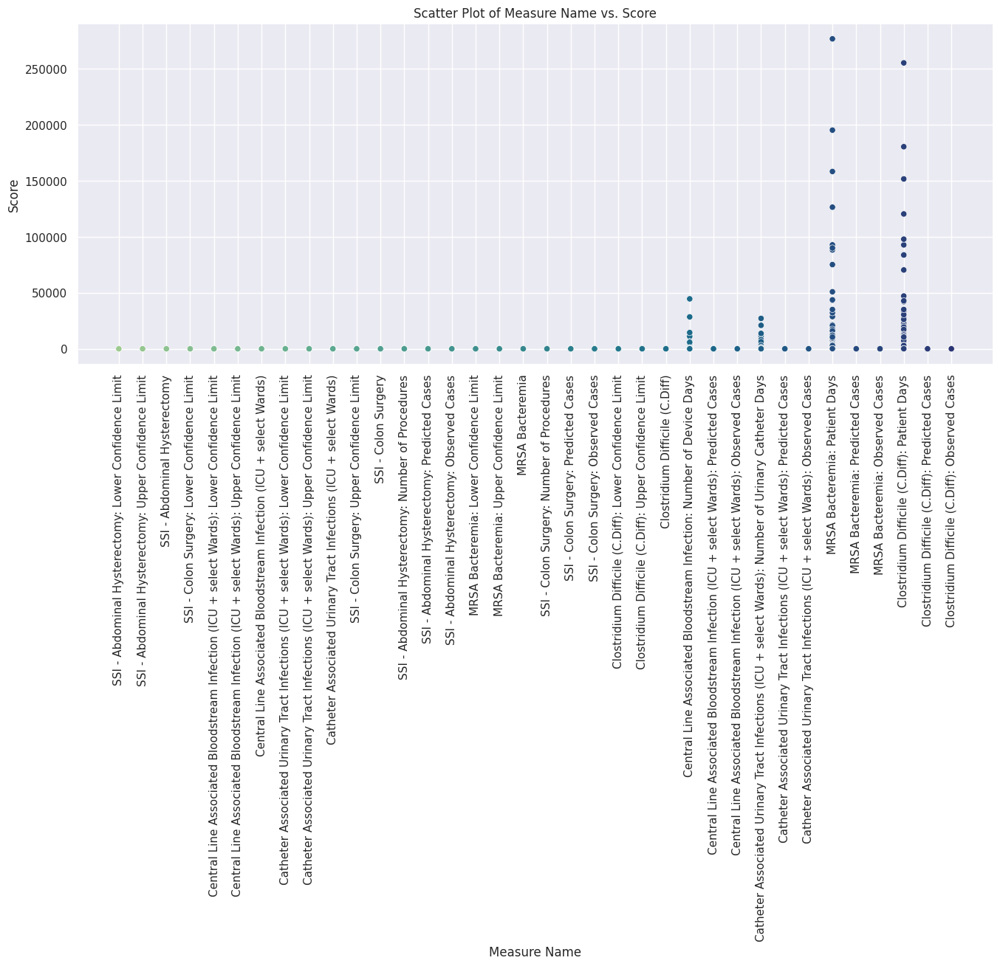

In [ ]:
plt.figure(figsize=(16, 6))
sns.scatterplot(x='Measure Name', y='Score', data = data , hue ='Measure Name' , palette = 'crest' , legend = False)
plt.title('Scatter Plot of Measure Name vs. Score')
plt.xlabel('Measure Name')
plt.ylabel('Score')
plt.xticks(rotation = 90)
plt.show()

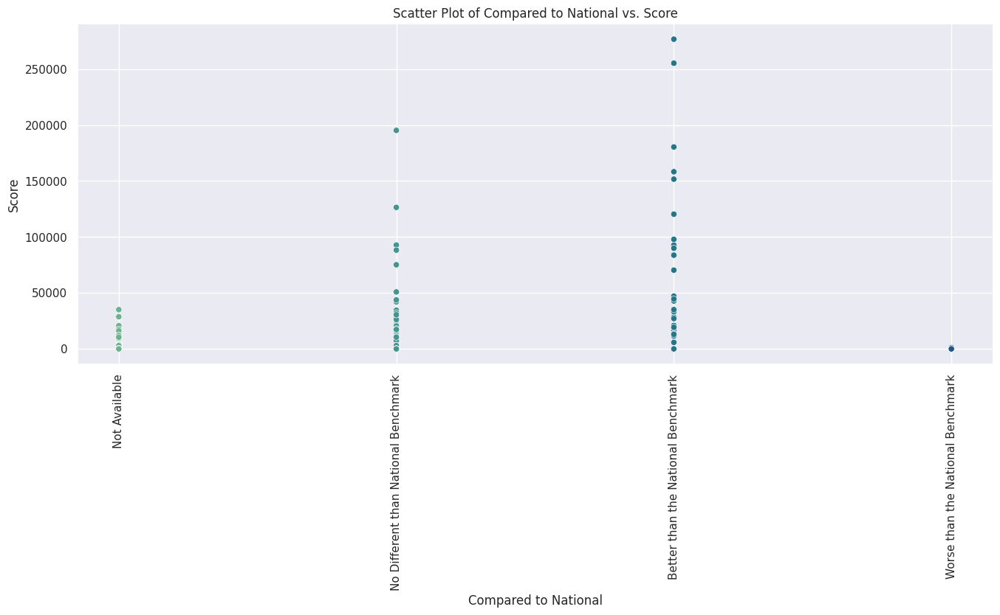

In [ ]:
plt.figure(figsize=(16, 6))
sns.scatterplot(x='Compared to National', y='Score', data = data , hue ='Compared to National' , palette = 'crest' , legend = False)
plt.title('Scatter Plot of Compared to National vs. Score')
plt.xlabel('Compared to National')
plt.ylabel('Score')
plt.xticks(rotation = 90)
plt.show()

# **HISTOGRAM**

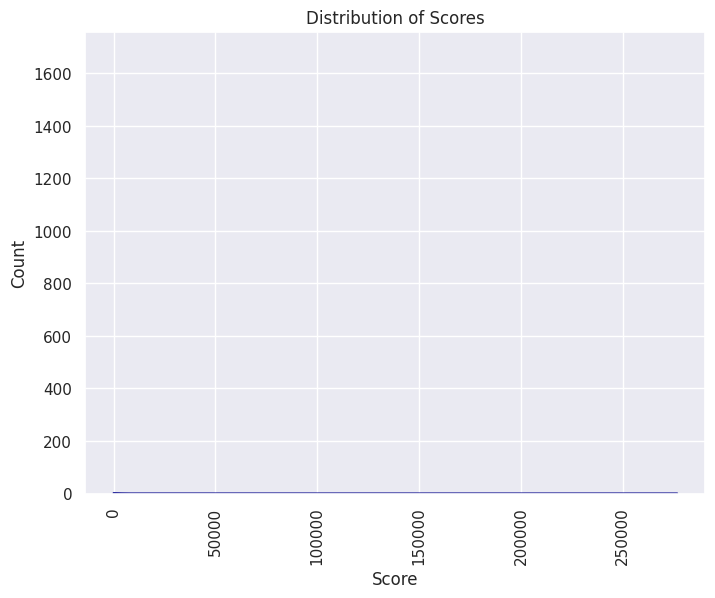

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data['Score'], kde=True, color='darkblue')
plt.xlabel('Score')
plt.ylabel('Count')
plt.title('Distribution of Scores')
plt.xticks(rotation = 90)
plt.show()

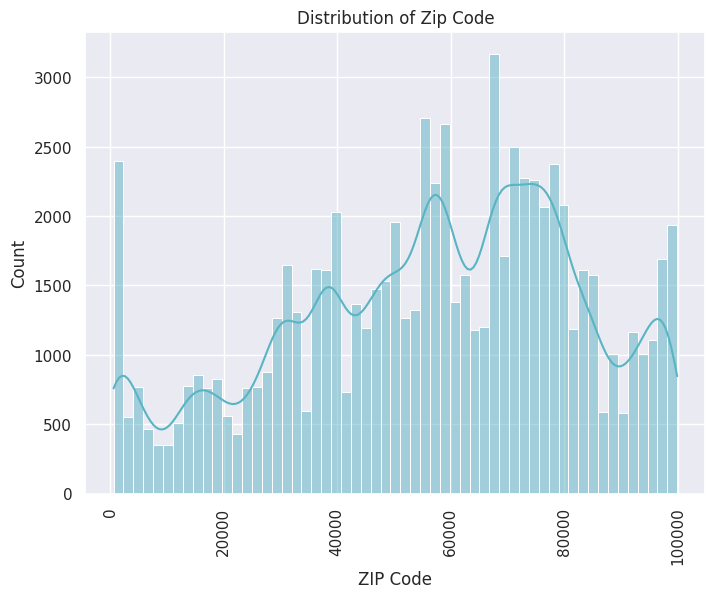

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data['ZIP Code'], kde=True, color='#59B4C3')
plt.xlabel('ZIP Code')
plt.ylabel('Count')
plt.title('Distribution of Zip Code')
plt.xticks(rotation = 90)
plt.show()

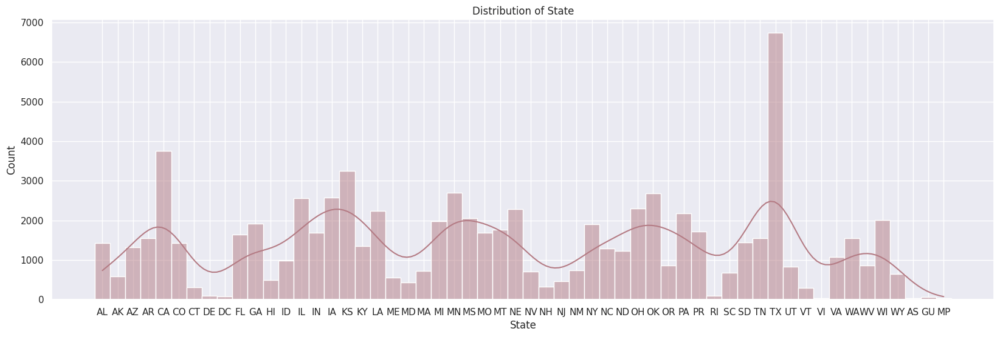

In [ ]:
plt.figure(figsize=(20, 6))
sns.histplot(data['State'], kde=True, color='#B47B84')
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of State')

plt.show()

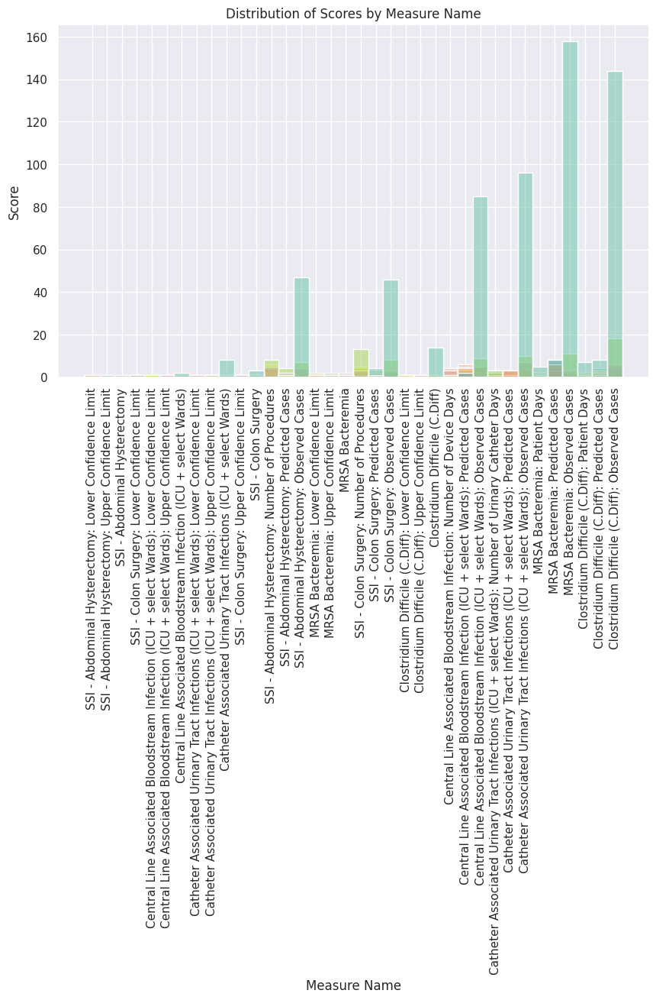

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='Measure Name', hue='Score', palette='Set2')
plt.xlabel('Measure Name')
plt.ylabel('Score')
plt.title('Distribution of Scores by Measure Name')
plt.xticks(rotation=90)
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='Measure ID', hue='Score', palette='coolwarm')
plt.xlabel('Measure ID')
plt.ylabel('Score')
plt.title('Distribution of Scores by Measure ID')
plt.xticks(rotation=90)
plt.show()

# **HEAT MAP**

<ipython-input-10-97f2c298a97b>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap='coolwarm')


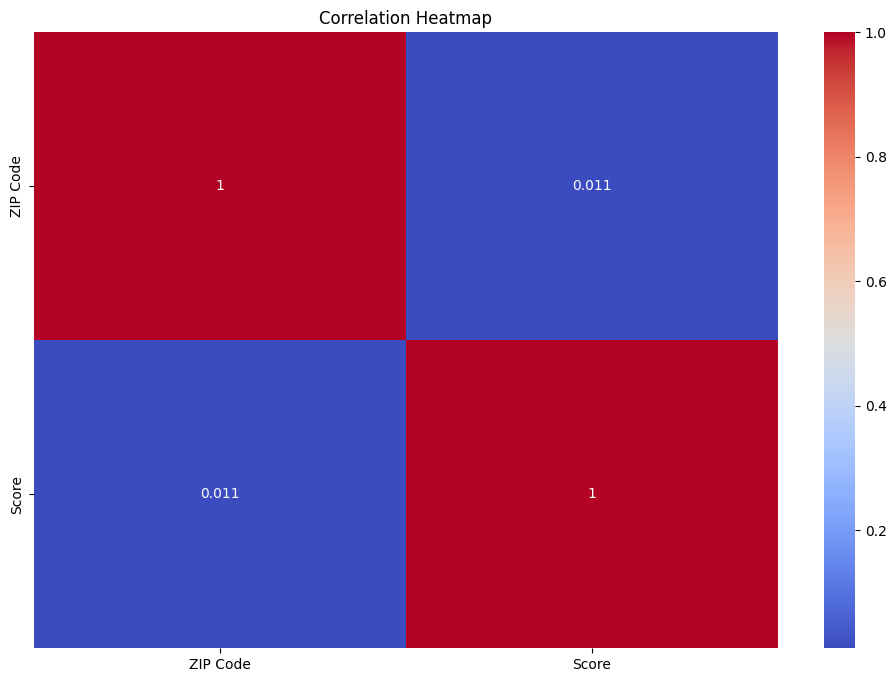

In [ ]:
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

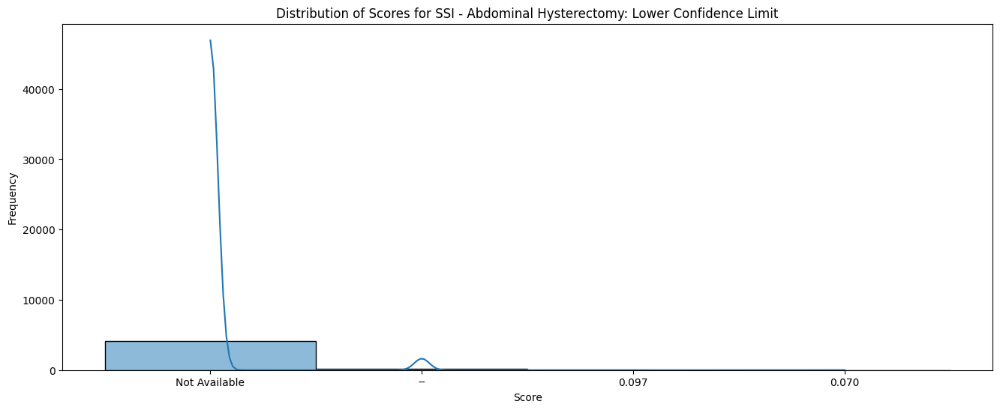

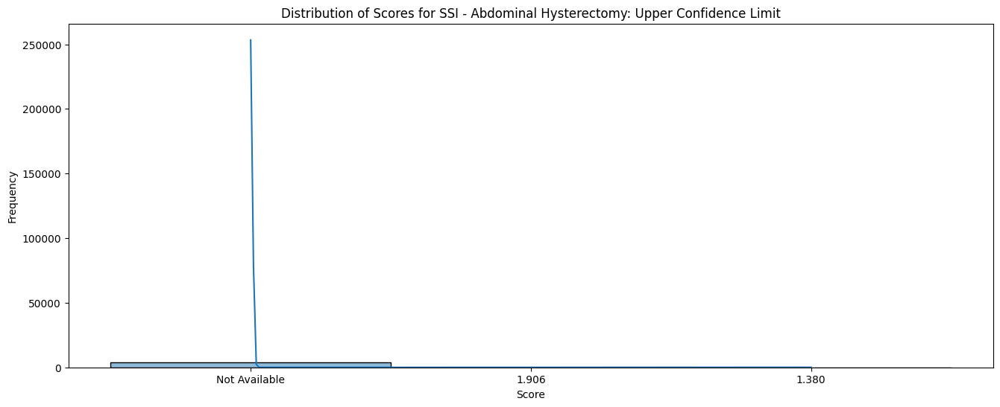

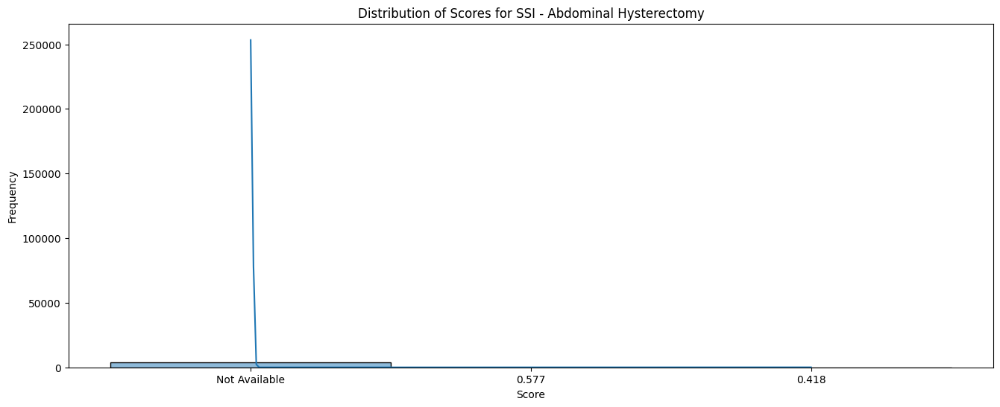

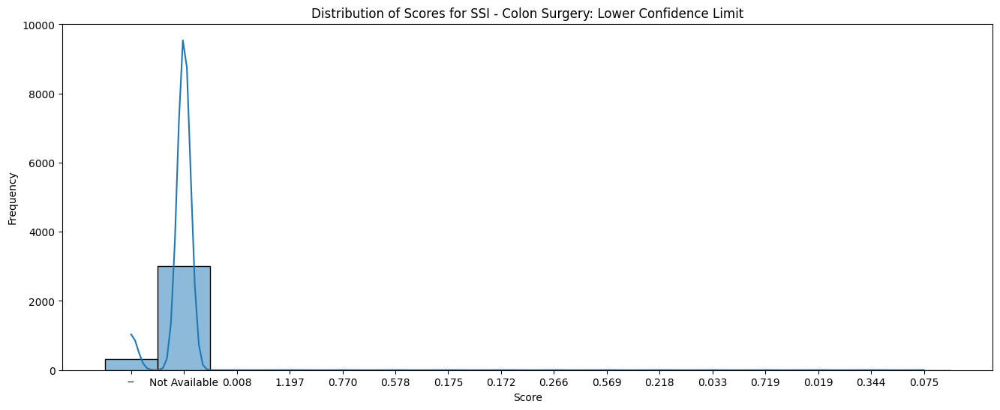

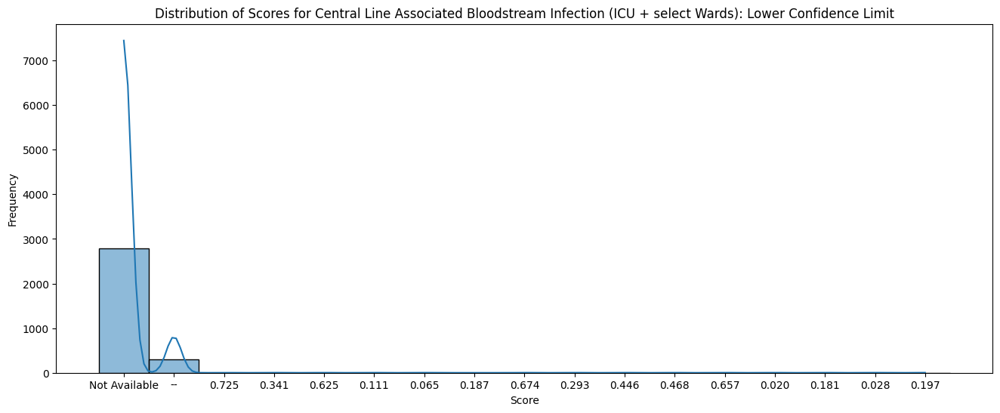

...

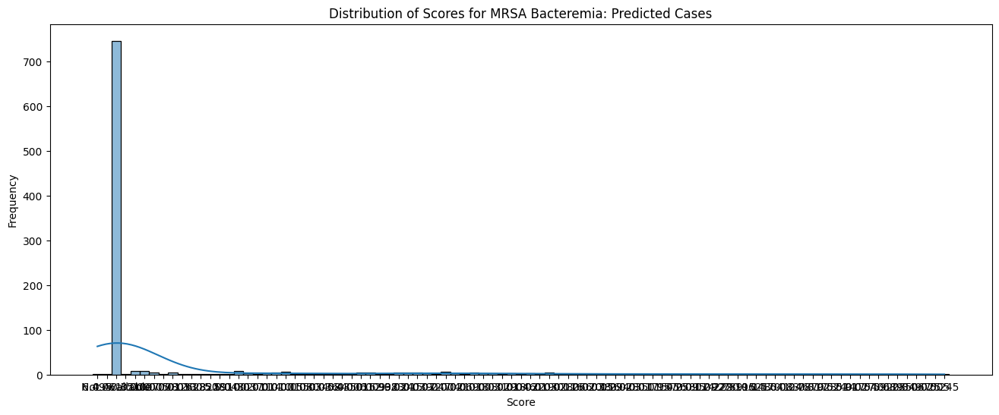

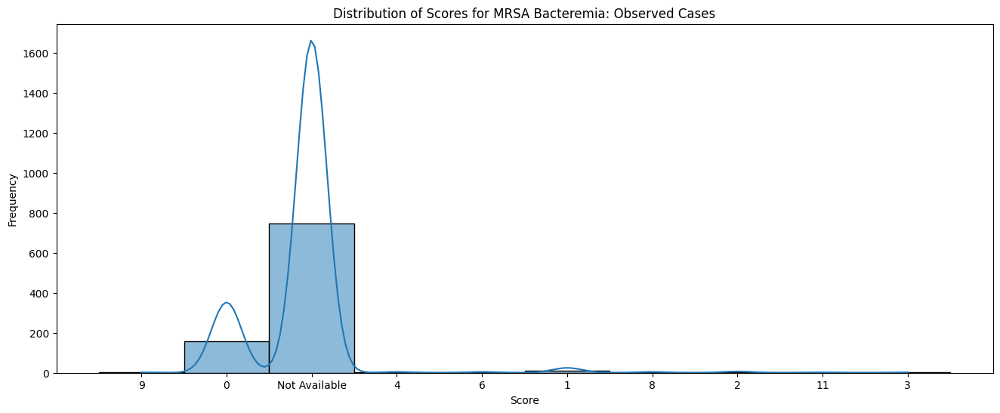

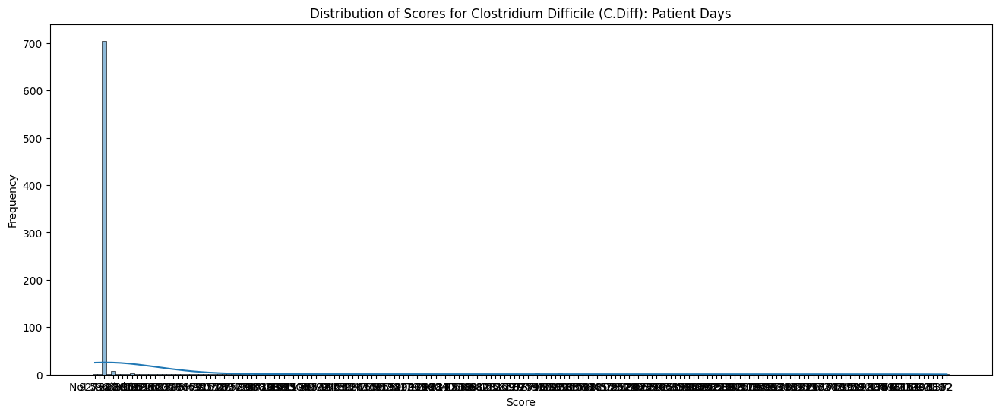

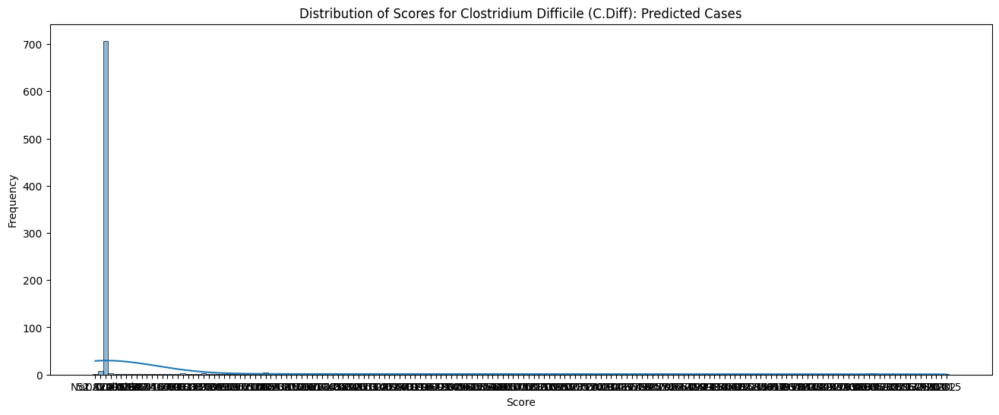

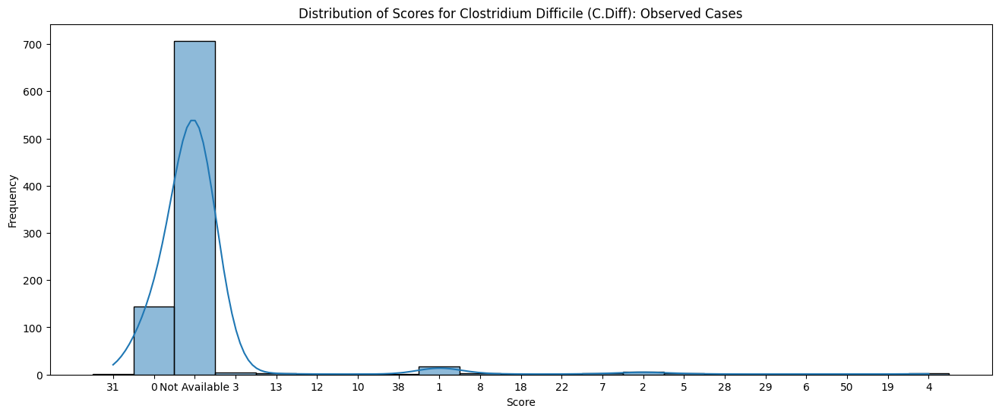

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
for measure in data['Measure Name'].unique():
    plt.figure(figsize=(16, 6))
    sns.histplot(data=data[data['Measure Name'] == measure], x='Score', kde=True)
    plt.title(f'Distribution of Scores for {measure}')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.show()

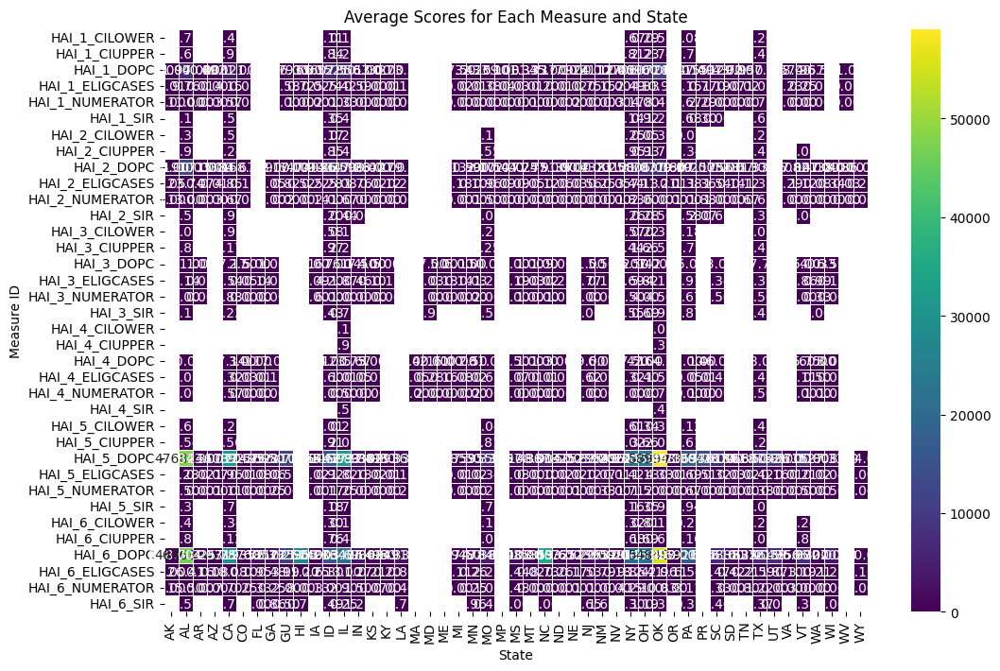

In [ ]:
# Pivot the data to create a table with Measure ID as rows, State as columns, and average Score as values
pivot_df = data.pivot_table(index='Measure ID', columns='State', values='Score', aggfunc='mean')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_df, cmap='viridis', annot=True, fmt='.2f', linewidths=0.5)
plt.title('Average Scores for Each Measure and State')
plt.xlabel('State')
plt.ylabel('Measure ID')
plt.show()

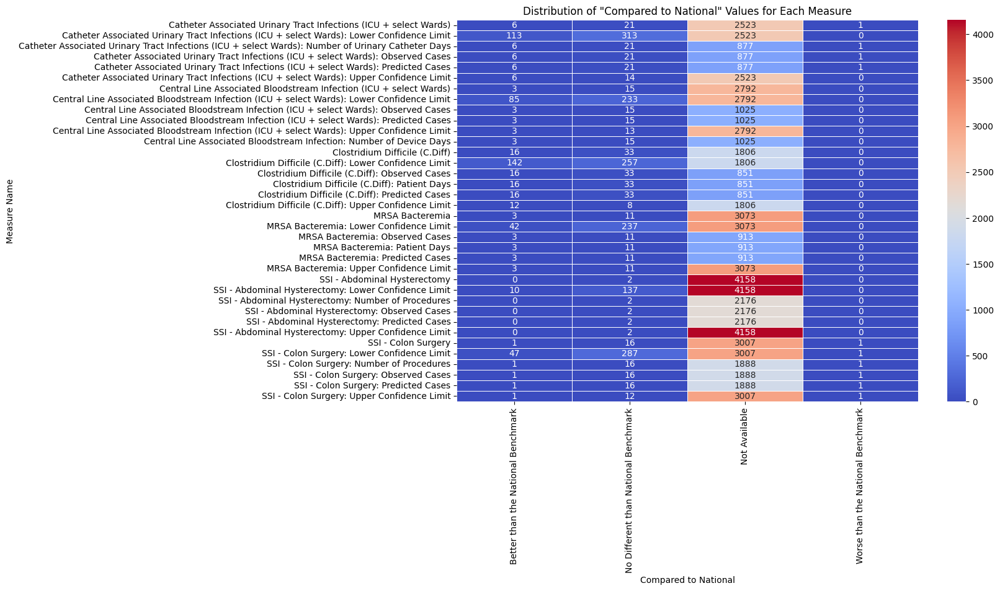

In [ ]:
pivot_df = data.pivot_table(index='Measure Name', columns='Compared to National', aggfunc='size', fill_value=0)
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_df, cmap='coolwarm', annot=True, fmt='d', linewidths=0.5)
plt.title('Distribution of "Compared to National" Values for Each Measure')
plt.xlabel('Compared to National')
plt.ylabel('Measure Name')
plt.show()

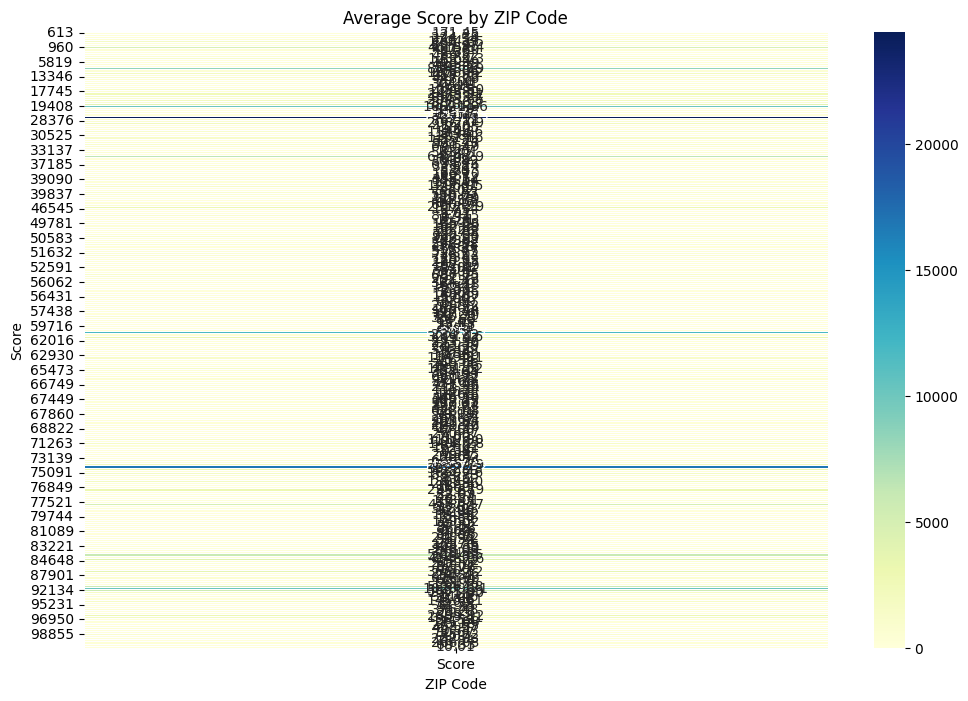

In [ ]:
# Aggregate the data to compute the average score for each ZIP code
avg_score_zip = data.groupby('ZIP Code')['Score'].mean().reset_index()
pivot_table = avg_score_zip.pivot_table(index='ZIP Code', values='Score')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=True, fmt='.2f', linewidths=0.5)
plt.title('Average Score by ZIP Code')
plt.xlabel('ZIP Code')
plt.ylabel('Score')
plt.show()

<ipython-input-16-78c7a1bb44fd>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  avg_measure = data.groupby(['Facility Name', 'Measure Name']).mean().reset_index()


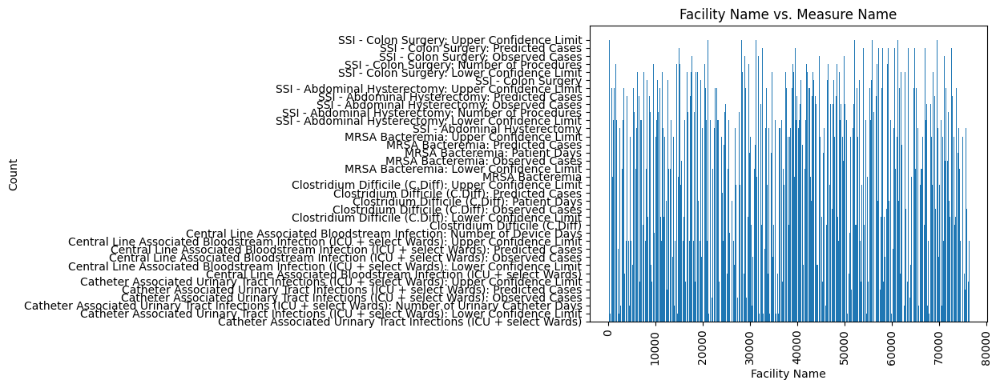

In [ ]:
import matplotlib.pyplot as plt
avg_measure = data.groupby(['Facility Name', 'Measure Name']).mean().reset_index()
plt.bar(avg_measure.index , avg_measure['Measure Name'])
plt.title('Facility Name vs. Measure Name')
plt.xlabel('Facility Name')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

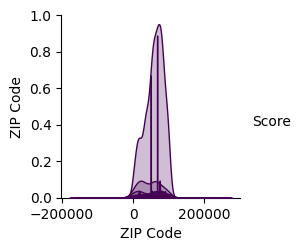

In [ ]:
vars_to_include = ['ZIP Code', 'State', 'Score']
pair_data = data[vars_to_include]
sns.pairplot(pair_data, hue='Score', palette='viridis')
plt.show()

# **TRAINING AND TESTING**

In [ ]:
import numpy as np
from sklearn.preprocessing import OneHotEncoder

# Specify categorical columns
categorical_columns = ['Facility ID', 'Facility Name', 'Address', 'City/Town', 'State',
                       'ZIP Code', 'County/Parish', 'Telephone Number', 'Measure ID',
                       'Measure Name', 'Compared to National', 'Footnote', 'Start Date', 'End Date']

# Perform one-hot encoding
one_hot_encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
encoded_features = one_hot_encoder.fit_transform(data[categorical_columns])

# Display the shape of the encoded features
print("Shape of encoded features:", encoded_features.shape)

# Display the encoded features
encoded_features

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Shape of encoded features: (77773, 26084)


array([[1., 0., 0., ..., 0., 1., 1.],
       [1., 0., 0., ..., 0., 1., 1.],
       [1., 0., 0., ..., 0., 1., 1.],
       ...,
       [0., 0., 0., ..., 0., 1., 1.],
       [0., 0., 0., ..., 0., 1., 1.],
       [0., 0., 0., ..., 0., 1., 1.]])

In [ ]:
from sklearn.preprocessing import LabelEncoder
categorical_columns = ['Facility ID', 'Facility Name', 'Address', 'City/Town', 'State',
                       'ZIP Code', 'County/Parish', 'Telephone Number', 'Measure ID',
                       'Measure Name', 'Compared to National', 'Footnote', 'Start Date', 'End Date']
label_encoder = LabelEncoder()
encoded_data = data.copy()
for column in categorical_columns:
    encoded_data[column] = label_encoder.fit_transform(encoded_data[column])
encoded_data

,Facility ID,Facility Name,Address,City/Town,State,ZIP Code,County/Parish,Telephone Number,Measure ID,Measure Name,Compared to National,Score,Footnote,Start Date,End Date
18,0,3440,453,671,1,1145,643,969,18,25,2,NaN,1,0,0
19,0,3440,453,671,1,1145,643,969,19,29,2,NaN,1,0,0
23,0,3440,453,671,1,1145,643,969,23,24,2,NaN,1,0,0
54,1,2131,1943,250,1,1128,851,431,18,25,2,NaN,1,0,0
55,1,2131,1943,250,1,1128,851,431,19,29,2,NaN,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173227,4400,3872,2942,2217,47,3020,365,1492,31,17,2,NaN,7,0,0
173228,4400,3872,2942,2217,47,3020,365,1492,32,15,2,NaN,7,0,0
173229,4400,3872,2942,2217,47,3020,365,1492,33,16,2,NaN,7,0,0
173230,4400,3872,2942,2217,47,3020,365,1492,34,14,2,NaN,7,0,0


In [ ]:
from sklearn.model_selection import train_test_split
X = encoded_data
y = data['Score']
X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state = 10)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error , r2_score
linear_model = LinearRegression()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
linear_model.fit(X_train, y_train)
y_pred = linear_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test , y_pred)
print("Mean Squared Error:", mse)
print(f'R-squared: {r2}')


ValueError: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

# **Linear Regression**

R2_Score = 1
MSE = 2.41

In [ ]:
from sklearn.impute import SimpleImputer

# Check for missing values in y_train
missing_values_count_y_train = y_train.isnull().sum()
print("Number of missing values in y_train:", missing_values_count_y_train)

# If there are missing values, apply imputation
if missing_values_count_y_train > 0:
    imputer_y_train = SimpleImputer(strategy='mean')
    y_train_imputed = imputer_y_train.fit_transform(y_train.values.reshape(-1, 1)).flatten()
else:
    y_train_imputed = y_train

# Check for missing values in y_test
missing_values_count_y_test = y_test.isnull().sum()
print("Number of missing values in y_test:", missing_values_count_y_test)

# If there are missing values, apply imputation
if missing_values_count_y_test > 0:
    imputer_y_test = SimpleImputer(strategy='mean')
    y_test_imputed = imputer_y_test.fit_transform(y_test.values.reshape(-1, 1)).flatten()
else:
    y_test_imputed = y_test


Number of missing values in y_train: 60189
Number of missing values in y_test: 15075


In [ ]:
import numpy as np

# Check for missing values in y_train_imputed
missing_values_count_y_train = np.isnan(y_train_imputed).sum()
print("Number of missing values in y_train after imputation:", missing_values_count_y_train)

# Check for missing values in y_test_imputed
missing_values_count_y_test = np.isnan(y_test_imputed).sum()
print("Number of missing values in y_test after imputation:", missing_values_count_y_test)


Number of missing values in y_train after imputation: 0
Number of missing values in y_test after imputation: 0


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize Linear Regression model
linear_model = LinearRegression()

# Fit the model on the training data
linear_model.fit(X_train_imputed, y_train_imputed)

# Make predictions on the test data
y_pred = linear_model.predict(X_test_imputed)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean Squared Error:", mse)
print("R-squared:", r2)


ValueError: Input contains NaN.

In [ ]:
import numpy as np

# Check for NaN values in y_test
nan_indices_test = np.isnan(y_test)
print("Number of NaN values in y_test:", nan_indices_test.sum())

# Check for NaN values in y_pred
nan_indices_pred = np.isnan(y_pred)
print("Number of NaN values in y_pred:", nan_indices_pred.sum())


Number of NaN values in y_test: 15075
Number of NaN values in y_pred: 0


In [ ]:
# Find indices of rows with NaN values in y_test
nan_indices_test = np.isnan(y_test)

# Filter out rows with NaN values from y_test and X_test
y_test_filtered = y_test[~nan_indices_test]
X_test_filtered = X_test[~nan_indices_test]

# Filter out corresponding rows from y_pred
y_pred_filtered = y_pred[~nan_indices_test]

# Evaluate the model performance
mse = mean_squared_error(y_test_filtered, y_pred_filtered)
r2 = r2_score(y_test_filtered, y_pred_filtered)
print("Mean Squared Error:", mse)
print(f'R-squared: {r2}')


Mean Squared Error: 2.4109439610337036e-24
R-squared: 1.0


# **Decision Tree**
Mean Squared Error: 14228150.349183805

R-squared: 0.7839956410602951

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
import numpy as np

# Initialize SimpleImputer with strategy 'mean' to replace missing values with the mean of each column
imputer_X = SimpleImputer(strategy='mean')
X_train_imputed = imputer_X.fit_transform(X_train)
X_test_imputed = imputer_X.transform(X_test)

# Initialize SimpleImputer with strategy 'mean' to replace missing values in y_train with its mean
imputer_y = SimpleImputer(strategy='mean')
y_train_imputed = imputer_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()

# Initialize DecisionTreeRegressor
decision_tree = DecisionTreeRegressor(random_state=42)

# Train the model
decision_tree.fit(X_train_imputed, y_train_imputed)

# Make predictions
y_pred = decision_tree.predict(X_test_imputed)

# Check for NaN values in y_test and y_pred
print("Number of NaN values in y_test:", np.isnan(y_test).sum())
print("Number of NaN values in y_pred:", np.isnan(y_pred).sum())

# Drop NaN values from y_test and corresponding rows from y_pred
y_test_non_nan = y_test[~np.isnan(y_test)]
y_pred_non_nan = y_pred[~np.isnan(y_test)]

# Calculate mean squared error and R-squared
mse = mean_squared_error(y_test_non_nan, y_pred_non_nan)
r2 = r2_score(y_test_non_nan, y_pred_non_nan)
print("Mean Squared Error:", mse)
print("R-squared:", r2)


Number of NaN values in y_test: 15075
Number of NaN values in y_pred: 0
Mean Squared Error: 14228150.349183805
R-squared: 0.7839956410602951


# **Random Forest**

Mean Squared Error (Random Forest) without NaN values: 807452.5245109107

R-squared (Random Forest) without NaN values: 0.9877416768412747

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize Random Forest Regressor
random_forest = RandomForestRegressor(random_state=42)

# Train the model
random_forest.fit(X_train_imputed, y_train_imputed)

# Make predictions
y_pred_rf = random_forest.predict(X_test_imputed)
# Remove rows with NaN values from y_test and y_pred_rf
y_test_no_nan = y_test[~np.isnan(y_test)]
y_pred_rf_no_nan = y_pred_rf[~np.isnan(y_test)]

# Calculate the mean squared error without NaN values
mse_rf = mean_squared_error(y_test_no_nan, y_pred_rf_no_nan)
r2_rf = r2_score(y_test_no_nan, y_pred_rf_no_nan)

print("Mean Squared Error (Random Forest) without NaN values:", mse_rf)
print("R-squared (Random Forest) without NaN values:", r2_rf)


Mean Squared Error (Random Forest) without NaN values: 807452.5245109107
R-squared (Random Forest) without NaN values: 0.9877416768412747


In [ ]:
# Check for missing values in y_test
missing_values_count_y_test = np.isnan(y_test).sum()
print("Number of missing values in y_test:", missing_values_count_y_test)

# Check for missing values in y_pred_rf
missing_values_count_y_pred_rf = np.isnan(y_pred_rf).sum()
print("Number of missing values in y_pred_rf:", missing_values_count_y_pred_rf)


Number of missing values in y_test: 15075
Number of missing values in y_pred_rf: 0


#**KNN**

Mean Squared Error (KNN) without NaN values: 146569.59000908106

R-squared (KNN) without NaN values: 0.9977748569172392

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize KNN Regressor
knn_regressor = KNeighborsRegressor()

# Train the model
knn_regressor.fit(X_train_imputed, y_train_imputed)

# Make predictions
y_pred_knn = knn_regressor.predict(X_test_imputed)

# Remove rows with NaN values from y_test and y_pred_knn
y_test_no_nan = y_test[~np.isnan(y_test)]
y_pred_knn_no_nan = y_pred_knn[~np.isnan(y_test)]

# Calculate the mean squared error without NaN values
mse_knn = mean_squared_error(y_test_no_nan, y_pred_knn_no_nan)
r2_knn = r2_score(y_test_no_nan, y_pred_knn_no_nan)

print("Mean Squared Error (KNN) without NaN values:", mse_knn)
print("R-squared (KNN) without NaN values:", r2_knn)


Mean Squared Error (KNN) without NaN values: 146569.59000908106
R-squared (KNN) without NaN values: 0.9977748569172392


# **SVM**
Mean Squared Error (SVM) without NaN values: 65406833.85751974  

R-squared (SVM) without NaN values: 0.007027556573451776

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

# Initialize Support Vector Regressor
svm_regressor = SVR()

# Train the model
svm_regressor.fit(X_train_imputed, y_train_imputed)

# Make predictions
y_pred_svm = svm_regressor.predict(X_test_imputed)

# Remove rows with NaN values from y_test and y_pred_svm
y_test_no_nan = y_test[~np.isnan(y_test)]
y_pred_svm_no_nan = y_pred_svm[~np.isnan(y_test)]

# Calculate the mean squared error without NaN values
mse_svm = mean_squared_error(y_test_no_nan, y_pred_svm_no_nan)
r2_svm = r2_score(y_test_no_nan, y_pred_svm_no_nan)

print("Mean Squared Error (SVM) without NaN values:", mse_svm)
print("R-squared (SVM) without NaN values:", r2_svm)


Mean Squared Error (SVM) without NaN values: 65406833.85751974
R-squared (SVM) without NaN values: 0.007027556573451776


# **Gradient Boosting**
Mean Squared Error (Gradient Boosting) without NaN values: 1730383.8325522046

R-squared (Gradient Boosting) without NaN values: 0.9737302150105892

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize Gradient Boosting Regressor
gradient_boosting = GradientBoostingRegressor(random_state=42)

# Train the model
gradient_boosting.fit(X_train_imputed, y_train_imputed)

# Make predictions
y_pred_gb = gradient_boosting.predict(X_test_imputed)

# Remove rows with NaN values from y_test and y_pred_gb
y_test_no_nan = y_test[~np.isnan(y_test)]
y_pred_gb_no_nan = y_pred_gb[~np.isnan(y_test)]

# Calculate the mean squared error without NaN values
mse_gb = mean_squared_error(y_test_no_nan, y_pred_gb_no_nan)
r2_gb = r2_score(y_test_no_nan, y_pred_gb_no_nan)

print("Mean Squared Error (Gradient Boosting) without NaN values:", mse_gb)
print("R-squared (Gradient Boosting) without NaN values:", r2_gb)


Mean Squared Error (Gradient Boosting) without NaN values: 1730383.8325522046
R-squared (Gradient Boosting) without NaN values: 0.9737302150105892


In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from sklearn.metrics import mean_squared_error

# Remove rows with NaN values from y_test and corresponding rows from X_test_imputed
valid_indices = ~np.isnan(y_test)
X_test_valid = X_test_imputed[valid_indices]
y_test_valid = y_test[valid_indices]

# Define the neural network architecture
model = Sequential()
model.add(Dense(64, input_shape=(X_train_imputed.shape[1],), activation='relu'))  # Input layer
model.add(Dense(32, activation='relu'))  # Hidden layer
model.add(Dense(1, activation='linear'))  # Output layer with linear activation for regression

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train_imputed, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Make predictions on the valid data
y_pred_nn = model.predict(X_test_valid)

# Calculate mean squared error
mse_nn = mean_squared_error(y_test_valid, y_pred_nn)

print("Mean Squared Error (Neural Network):", mse_nn)


Epoch 1/50
1556/1556 [==============================] - 12s 6ms/step - loss: nan - val_loss: nan
Epoch 2/50
1556/1556 [==============================] - 4s 3ms/step - loss: nan - val_loss: nan
Epoch 3/50
1556/1556 [==============================] - 5s 3ms/step - loss: nan - val_loss: nan
Epoch 4/50
1556/1556 [==============================] - 4s 3ms/step - loss: nan - val_loss: nan
Epoch 5/50
1556/1556 [==============================] - 4s 2ms/step - loss: nan - val_loss: nan
Epoch 6/50
1556/1556 [==============================] - 6s 4ms/step - loss: nan - val_loss: nan
Epoch 7/50
1556/1556 [==============================] - 4s 3ms/step - loss: nan - val_loss: nan
Epoch 8/50
1556/1556 [==============================] - 5s 3ms/step - loss: nan - val_loss: nan
Epoch 9/50
1556/1556 [==============================] - 4s 3ms/step - loss: nan - val_loss: nan
Epoch 10/50
1556/1556 [==============================] - 4s 3ms/step - loss: nan - val_loss: nan
Epoch 11/50
1556/1556 [===============

ValueError: Input contains NaN.

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer

imputer_y = SimpleImputer(strategy='mean')
y_train_imputed = imputer_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()

# Initialize Gaussian Naive Bayes model
naive_bayes = GaussianNB()
naive_bayes.fit(X_train_imputed, y_train_imputed)

y_pred_nb = naive_bayes.predict(X_test_imputed)

accuracy = accuracy_score(y_test, y_pred_nb)
classification_rep = classification_report(y_test, y_pred_nb)

print("Accuracy:", accuracy)
#print("Classification Report:\n", classification_rep)


ValueError: Unknown label type: (array([0.00000000e+00, 1.00000000e-03, 2.00000000e-03, 3.00000000e-03,
       4.00000000e-03, 5.00000000e-03, 6.00000000e-03, 7.00000000e-03,
       8.00000000e-03, 9.00000000e-03, 1.00000000e-02, 1.10000000e-02,
       1.20000000e-02, 1.30000000e-02, 1.40000000e-02, 1.50000000e-02,
       1.60000000e-02, 1.70000000e-02, 1.80000000e-02, 1.90000000e-02,
       2.00000000e-02, 2.10000000e-02, 2.20000000e-02, 2.30000000e-02,
       2.40000000e-02, 2.50000000e-02, 2.70000000e-02, 2.80000000e-02,
       2.90000000e-02, 3.00000000e-02, 3.10000000e-02, 3.20000000e-02,
       3.30000000e-02, 3.40000000e-02, 3.50000000e-02, 3.60000000e-02,
       3.70000000e-02, 3.80000000e-02, 3.90000000e-02, 4.00000000e-02,
       4.20000000e-02, 4.30000000e-02, 4.40000000e-02, 4.60000000e-02,
       4.70000000e-02, 4.80000000e-02, 4.90000000e-02, 5.00000000e-02,
       5.10000000e-02, 5.20000000e-02, 5.40000000e-02, 5.60000000e-02,
       5.80000000e-02, 5.90000000e-02, 6.00000000e-02, 6.10000000e-02,
       6.50000000e-02, 6.60000000e-02, 6.90000000e-02, 7.00000000e-02,
       7.20000000e-02, 7.40000000e-02, 7.50000000e-02, 7.60000000e-02,
       7.70000000e-02, 7.80000000e-02, 8.00000000e-02, 8.30000000e-02,
       8.40000000e-02, 8.60000000e-02, 8.70000000e-02, 8.80000000e-02,
       9.00000000e-02, 9.20000000e-02, 9.40000000e-02, 9.50000000e-02,
       9.60000000e-02, 9.70000000e-02, 9.80000000e-02, 9.90000000e-02,
       1.00000000e-01, 1.01000000e-01, 1.02000000e-01, 1.04000000e-01,
       1.05000000e-01, 1.07000000e-01, 1.08000000e-01, 1.09000000e-01,
       1.10000000e-01, 1.11000000e-01, 1.12000000e-01, 1.14000000e-01,
       1.15000000e-01, 1.16000000e-01, 1.17000000e-01, 1.19000000e-01,
       1.21000000e-01, 1.22000000e-01, 1.23000000e-01, 1.26000000e-01,
       1.28000000e-01, 1.30000000e-01, 1.31000000e-01, 1.32000000e-01,
       1.33000000e-01, 1.34000000e-01, 1.38000000e-01, 1.39000000e-01,
       1.40000000e-01, 1.42000000e-01, 1.44000000e-01, 1.45000000e-01,
       1.48000000e-01, 1.53000000e-01, 1.55000000e-01, 1.57000000e-01,
       1.59000000e-01, 1.61000000e-01, 1.62000000e-01, 1.63000000e-01,
       1.64000000e-01, 1.65000000e-01, 1.70000000e-01, 1.71000000e-01,
       1.72000000e-01, 1.74000000e-01, 1.75000000e-01, 1.76000000e-01,
       1.77000000e-01, 1.79000000e-01, 1.80000000e-01, 1.84000000e-01,
       1.88000000e-01, 1.90000000e-01, 1.91000000e-01, 1.93000000e-01,
       1.94000000e-01, 1.96000000e-01, 1.97000000e-01, 1.99000000e-01,
       2.02000000e-01, 2.04000000e-01, 2.12000000e-01, 2.14000000e-01,
       2.15000000e-01, 2.17000000e-01, 2.18000000e-01, 2.20000000e-01,
       2.22000000e-01, 2.23000000e-01, 2.24000000e-01, 2.26000000e-01,
       2.29000000e-01, 2.33000000e-01, 2.35000000e-01, 2.38000000e-01,
       2.39000000e-01, 2.41000000e-01, 2.44000000e-01, 2.46000000e-01,
       2.47000000e-01, 2.54000000e-01, 2.58000000e-01, 2.61000000e-01,
       2.66000000e-01, 2.70000000e-01, 2.73000000e-01, 2.78000000e-01,
       2.81000000e-01, 2.84000000e-01, 2.85000000e-01, 2.91000000e-01,
       2.93000000e-01, 2.95000000e-01, 2.96000000e-01, 3.01000000e-01,
       3.02000000e-01, 3.03000000e-01, 3.04000000e-01, 3.05000000e-01,
       3.06000000e-01, 3.07000000e-01, 3.14000000e-01, 3.17000000e-01,
       3.18000000e-01, 3.19000000e-01, 3.20000000e-01, 3.22000000e-01,
       3.27000000e-01, 3.32000000e-01, 3.36000000e-01, 3.37000000e-01,
       3.40000000e-01, 3.41000000e-01, 3.42000000e-01, 3.44000000e-01,
       3.49000000e-01, 3.50000000e-01, 3.51000000e-01, 3.55000000e-01,
       3.56000000e-01, 3.62000000e-01, 3.65000000e-01, 3.70000000e-01,
       3.72000000e-01, 3.73000000e-01, 3.80000000e-01, 3.81000000e-01,
       3.86000000e-01, 3.93000000e-01, 3.95000000e-01, 4.00000000e-01,
       4.01000000e-01, 4.03000000e-01, 4.04000000e-01, 4.05000000e-01,
       4.06000000e-01, 4.07000000e-01, 4.11000000e-01, 4.16000000e-01,
       4.17000000e-01, 4.20000000e-01, 4.25000000e-01, 4.26000000e-01,
       4.34000000e-01, 4.35000000e-01, 4.37000000e-01, 4.45000000e-01,
       4.46000000e-01, 4.51000000e-01, 4.55000000e-01, 4.57000000e-01,
       4.58000000e-01, 4.60000000e-01, 4.62000000e-01, 4.68000000e-01,
       4.70000000e-01, 4.73000000e-01, 4.74000000e-01, 4.77000000e-01,
       4.80000000e-01, 4.82000000e-01, 4.86000000e-01, 4.93000000e-01,
       4.98000000e-01, 5.05000000e-01, 5.08000000e-01, 5.10000000e-01,
       5.14000000e-01, 5.15000000e-01, 5.16000000e-01, 5.20000000e-01,
       5.26000000e-01, 5.42000000e-01, 5.45000000e-01, 5.48000000e-01,
       5.55000000e-01, 5.56000000e-01, 5.60000000e-01, 5.69000000e-01,
       5.77000000e-01, 5.78000000e-01, 5.87000000e-01, 5.88000000e-01,
       5.90000000e-01, 6.02000000e-01, 6.09000000e-01, 6.14000000e-01,
       6.17000000e-01, 6.19000000e-01, 6.22000000e-01, 6.23000000e-01,
       6.25000000e-01, 6.26000000e-01, 6.52000000e-01, 6.54000000e-01,
       6.55000000e-01, 6.57000000e-01, 6.65000000e-01, 6.66000000e-01,
       6.67000000e-01, 6.73000000e-01, 6.74000000e-01, 6.76000000e-01,
       6.82000000e-01, 6.85000000e-01, 6.87000000e-01, 6.88000000e-01,
       6.89000000e-01, 7.00000000e-01, 7.10000000e-01, 7.14000000e-01,
       7.15000000e-01, 7.17000000e-01, 7.19000000e-01, 7.25000000e-01,
       7.30000000e-01, 7.31000000e-01, 7.48000000e-01, 7.52000000e-01,
       7.54000000e-01, 7.60000000e-01, 7.61000000e-01, 7.63000000e-01,
       7.64000000e-01, 7.68000000e-01, 7.70000000e-01, 7.73000000e-01,
       7.75000000e-01, 7.76000000e-01, 7.80000000e-01, 7.85000000e-01,
       7.87000000e-01, 8.11000000e-01, 8.22000000e-01, 8.23000000e-01,
       8.30000000e-01, 8.43000000e-01, 8.47000000e-01, 8.58000000e-01,
       8.59000000e-01, 8.61000000e-01, 8.62000000e-01, 8.74000000e-01,
       8.87000000e-01, 8.92000000e-01, 9.04000000e-01, 9.07000000e-01,
       9.13000000e-01, 9.17000000e-01, 9.23000000e-01, 9.27000000e-01,
       9.35000000e-01, 9.39000000e-01, 9.41000000e-01, 9.44000000e-01,
       9.55000000e-01, 9.62000000e-01, 9.69000000e-01, 9.71000000e-01,
       9.95000000e-01, 1.00000000e+00, 1.01900000e+00, 1.02000000e+00,
       1.02400000e+00, 1.02700000e+00, 1.03200000e+00, 1.05700000e+00,
       1.05900000e+00, 1.06300000e+00, 1.07100000e+00, 1.07300000e+00,
       1.07500000e+00, 1.07600000e+00, 1.08100000e+00, 1.12700000e+00,
       1.13900000e+00, 1.14400000e+00, 1.14700000e+00, 1.16000000e+00,
       1.16300000e+00, 1.16500000e+00, 1.17000000e+00, 1.18900000e+00,
       1.19700000e+00, 1.20600000e+00, 1.25900000e+00, 1.26000000e+00,
       1.26600000e+00, 1.27200000e+00, 1.27400000e+00, 1.28400000e+00,
       1.29400000e+00, 1.29600000e+00, 1.31200000e+00, 1.32600000e+00,
       1.34600000e+00, 1.35200000e+00, 1.36100000e+00, 1.37000000e+00,
       1.38000000e+00, 1.38600000e+00, 1.39700000e+00, 1.42200000e+00,
       1.42700000e+00, 1.44300000e+00, 1.45200000e+00, 1.49400000e+00,
       1.50200000e+00, 1.52800000e+00, 1.55200000e+00, 1.57000000e+00,
       1.58000000e+00, 1.58900000e+00, 1.60700000e+00, 1.61500000e+00,
       1.64100000e+00, 1.65800000e+00, 1.67400000e+00, 1.67600000e+00,
       1.67900000e+00, 1.68500000e+00, 1.71800000e+00, 1.73400000e+00,
       1.76100000e+00, 1.78100000e+00, 1.79200000e+00, 1.81300000e+00,
       1.83600000e+00, 1.83900000e+00, 1.84400000e+00, 1.85000000e+00,
       1.85900000e+00, 1.87300000e+00, 1.88900000e+00, 1.89900000e+00,
       1.90600000e+00, 1.94700000e+00, 1.96300000e+00, 1.97300000e+00,
       1.99900000e+00, 2.00000000e+00, 2.02200000e+00, 2.06300000e+00,
       2.06600000e+00, 2.07000000e+00, 2.10300000e+00, 2.16900000e+00,
       2.21900000e+00, 2.22700000e+00, 2.22900000e+00, 2.28900000e+00,
       2.31100000e+00, 2.32300000e+00, 2.41300000e+00, 2.47600000e+00,
       2.47700000e+00, 2.48800000e+00, 2.49100000e+00, 2.50000000e+00,
       2.54300000e+00, 2.56000000e+00, 2.59600000e+00, 2.59700000e+00,
       2.68600000e+00, 2.69600000e+00, 2.76400000e+00, 2.78900000e+00,
       2.79700000e+00, 2.84400000e+00, 2.89900000e+00, 2.91800000e+00,
       2.96800000e+00, 3.00000000e+00, 3.19800000e+00, 3.37400000e+00,
       3.39400000e+00, 3.42300000e+00, 3.44500000e+00, 3.55400000e+00,
       3.57200000e+00, 3.66300000e+00, 3.67900000e+00, 3.81100000e+00,
       4.00000000e+00, 4.08400000e+00, 4.20400000e+00, 4.20900000e+00,
       4.26000000e+00, 4.33300000e+00, 4.35600000e+00, 4.36400000e+00,
       4.49300000e+00, 4.78800000e+00, 4.98600000e+00, 5.00000000e+00,
       5.17200000e+00, 5.23200000e+00, 5.32200000e+00, 5.43500000e+00,
       5.59100000e+00, 5.59200000e+00, 6.00000000e+00, 6.02800000e+00,
       6.14200000e+00, 6.45100000e+00, 6.45700000e+00, 6.65600000e+00,
       7.00000000e+00, 7.15700000e+00, 8.00000000e+00, 8.14500000e+00,
       8.48900000e+00, 9.00000000e+00, 9.45600000e+00, 9.81400000e+00,
       1.00000000e+01, 1.01360000e+01, 1.02360000e+01, 1.04860000e+01,
       1.08220000e+01, 1.10000000e+01, 1.12040000e+01, 1.14390000e+01,
       1.19980000e+01, 1.20000000e+01, 1.30000000e+01, 1.36010000e+01,
       1.39480000e+01, 1.40000000e+01, 1.40510000e+01, 1.47540000e+01,
       1.50000000e+01, 1.60000000e+01, 1.66560000e+01, 1.70000000e+01,
       1.72980000e+01, 1.80000000e+01, 1.90000000e+01, 1.95080000e+01,
       2.00000000e+01, 2.10000000e+01, 2.20000000e+01, 2.22230000e+01,
       2.30000000e+01, 2.34580000e+01, 2.37420000e+01, 2.41990000e+01,
       2.43940000e+01, 2.49100000e+01, 2.60000000e+01, 2.70000000e+01,
       2.76640000e+01, 2.80000000e+01, 2.81860000e+01, 2.90000000e+01,
       3.00000000e+01, 3.10000000e+01, 3.20000000e+01, 3.30000000e+01,
       3.40000000e+01, 3.60000000e+01, 3.65290000e+01, 3.70000000e+01,
       3.80000000e+01, 3.90000000e+01, 4.00000000e+01, 4.10000000e+01,
       4.20000000e+01, 4.30000000e+01, 4.40000000e+01, 4.50000000e+01,
       4.60000000e+01, 4.70000000e+01, 4.75240000e+01, 4.80000000e+01,
       4.81660000e+01, 5.00000000e+01, 5.10000000e+01, 5.28220000e+01,
       5.30000000e+01, 5.40000000e+01, 5.50000000e+01, 5.52090000e+01,
       5.70000000e+01, 5.80000000e+01, 5.85720000e+01, 5.90000000e+01,
       6.00000000e+01, 6.20000000e+01, 6.40000000e+01, 6.70000000e+01,
       7.00000000e+01, 7.40000000e+01, 7.60000000e+01, 7.70000000e+01,
       7.80000000e+01, 7.90000000e+01, 8.10000000e+01, 8.30000000e+01,
       8.40000000e+01, 8.50000000e+01, 8.60000000e+01, 8.70000000e+01,
       8.80000000e+01, 8.90000000e+01, 9.00000000e+01, 9.10000000e+01,
       9.20000000e+01, 9.50000000e+01, 9.60000000e+01, 9.70000000e+01,
       9.72140000e+01, 9.90000000e+01, 1.00000000e+02, 1.02705000e+02,
       1.05000000e+02, 1.06000000e+02, 1.07000000e+02, 1.08000000e+02,
       1.12000000e+02, 1.14000000e+02, 1.16000000e+02, 1.19000000e+02,
       1.22000000e+02, 1.26000000e+02, 1.28000000e+02, 1.29000000e+02,
       1.32000000e+02, 1.37000000e+02, 1.38000000e+02, 1.41000000e+02,
       1.42000000e+02, 1.43000000e+02, 1.45000000e+02, 1.54000000e+02,
       1.57000000e+02, 1.58000000e+02, 1.62000000e+02, 1.65000000e+02,
       1.66000000e+02, 1.67000000e+02, 1.69000000e+02, 1.72000000e+02,
       1.79000000e+02, 1.82000000e+02, 1.93000000e+02, 1.96000000e+02,
       2.07000000e+02, 2.08000000e+02, 2.10000000e+02, 2.11000000e+02,
       2.12000000e+02, 2.15000000e+02, 2.22000000e+02, 2.34000000e+02,
       2.42000000e+02, 2.44000000e+02, 2.46000000e+02, 2.47000000e+02,
       2.54000000e+02, 2.61000000e+02, 2.67000000e+02, 2.69000000e+02,
       2.94000000e+02, 3.17000000e+02, 3.20000000e+02, 3.22000000e+02,
       3.37000000e+02, 3.40000000e+02, 3.43000000e+02, 3.45000000e+02,
       3.49000000e+02, 3.55000000e+02, 3.57000000e+02, 3.59000000e+02,
       3.60000000e+02, 3.65000000e+02, 3.66000000e+02, 3.74000000e+02,
       3.77000000e+02, 3.87000000e+02, 3.99000000e+02, 4.01000000e+02,
       4.03000000e+02, 4.09000000e+02, 4.26000000e+02, 4.28000000e+02,
       4.31000000e+02, 4.33000000e+02, 4.36000000e+02, 4.44000000e+02,
       4.50000000e+02, 4.71000000e+02, 4.80000000e+02, 4.90000000e+02,
       4.93000000e+02, 4.95000000e+02, 5.00000000e+02, 5.07000000e+02,
       5.32000000e+02, 5.41000000e+02, 5.49000000e+02, 5.52000000e+02,
       5.68000000e+02, 5.80000000e+02, 5.89000000e+02, 5.93000000e+02,
       5.94000000e+02, 5.96000000e+02, 6.23000000e+02, 6.32000000e+02,
       6.33000000e+02, 6.34000000e+02, 6.39000000e+02, 6.47000000e+02,
       6.58000000e+02, 6.68000000e+02, 6.69000000e+02, 6.75000000e+02,
       6.81000000e+02, 6.86000000e+02, 6.87000000e+02, 6.94000000e+02,
       7.02000000e+02, 7.12000000e+02, 7.30000000e+02, 7.38000000e+02,
       7.40000000e+02, 7.45000000e+02, 7.46000000e+02, 7.47000000e+02,
       7.56000000e+02, 7.66000000e+02, 7.85000000e+02, 7.91000000e+02,
       7.98000000e+02, 8.18000000e+02, 8.31000000e+02, 8.42000000e+02,
       8.43000000e+02, 8.45000000e+02, 8.50000000e+02, 8.56000000e+02,
       8.66000000e+02, 8.75000000e+02, 8.77000000e+02, 9.00000000e+02,
       9.01000000e+02, 9.14000000e+02, 9.17000000e+02, 9.19000000e+02,
       9.24000000e+02, 9.30000000e+02, 9.41000000e+02, 9.49000000e+02,
       9.71000000e+02, 9.76000000e+02, 9.90000000e+02, 1.00700000e+03,
       1.00900000e+03, 1.01000000e+03, 1.03000000e+03, 1.05600000e+03,
       1.06600000e+03, 1.09200000e+03, 1.10900000e+03, 1.13200000e+03,
       1.18100000e+03, 1.19400000e+03, 1.19600000e+03, 1.22700000e+03,
       1.28400000e+03, 1.31600000e+03, 1.34200000e+03, 1.36900000e+03,
       1.37100000e+03, 1.38800000e+03, 1.40500000e+03, 1.41700000e+03,
       1.44800000e+03, 1.46000000e+03, 1.47400000e+03, 1.55600000e+03,
       1.60500000e+03, 1.61400000e+03, 1.64764125e+03, 1.65400000e+03,
       1.66100000e+03, 1.66400000e+03, 1.67500000e+03, 1.72100000e+03,
       1.74500000e+03, 1.74600000e+03, 1.79100000e+03, 1.79200000e+03,
       1.79300000e+03, 1.81300000e+03, 1.87400000e+03, 1.88400000e+03,
       1.88900000e+03, 1.89000000e+03, 1.91300000e+03, 1.98200000e+03,
       2.03100000e+03, 2.06300000e+03, 2.07000000e+03, 2.07300000e+03,
       2.07800000e+03, 2.21400000e+03, 2.32500000e+03, 2.33800000e+03,
       2.44100000e+03, 2.45600000e+03, 2.50900000e+03, 2.52900000e+03,
       2.57200000e+03, 2.63500000e+03, 2.65300000e+03, 2.68300000e+03,
       2.74600000e+03, 2.89000000e+03, 2.90800000e+03, 2.92100000e+03,
       2.93700000e+03, 2.96200000e+03, 3.01200000e+03, 3.20600000e+03,
       3.23600000e+03, 3.27000000e+03, 3.34700000e+03, 3.43300000e+03,
       3.43400000e+03, 3.43900000e+03, 3.44900000e+03, 3.85000000e+03,
       3.88900000e+03, 3.91600000e+03, 3.95700000e+03, 4.02700000e+03,
       4.03600000e+03, 4.13500000e+03, 4.39600000e+03, 4.58500000e+03,
       4.69600000e+03, 4.80200000e+03, 4.91200000e+03, 4.94700000e+03,
       4.95500000e+03, 5.00700000e+03, 5.33900000e+03, 5.48600000e+03,
       5.78900000e+03, 5.80600000e+03, 6.33000000e+03, 6.43000000e+03,
       6.55700000e+03, 6.82300000e+03, 7.14900000e+03, 7.30800000e+03,
       8.14100000e+03, 9.57400000e+03, 1.04840000e+04, 1.05860000e+04,
       1.09980000e+04, 1.10210000e+04, 1.16280000e+04, 1.19170000e+04,
       1.21100000e+04, 1.22240000e+04, 1.33340000e+04, 1.35550000e+04,
       1.37200000e+04, 1.41740000e+04, 1.42310000e+04, 1.60560000e+04,
       1.72420000e+04, 1.75040000e+04, 1.77670000e+04, 1.89620000e+04,
       1.93200000e+04, 2.04470000e+04, 2.07450000e+04, 2.09270000e+04,
       2.14020000e+04, 2.62180000e+04, 2.75350000e+04, 2.87440000e+04,
       3.04780000e+04, 3.21680000e+04, 3.32040000e+04, 3.45370000e+04,
       3.50690000e+04, 4.20320000e+04, 4.32210000e+04, 4.45700000e+04,
       4.70890000e+04, 5.09010000e+04, 7.03610000e+04, 7.51520000e+04,
       8.37140000e+04, 8.99740000e+04, 9.27310000e+04, 9.27610000e+04,
       1.20357000e+05, 1.26408000e+05, 1.51634000e+05, 1.58259000e+05,
       1.80387000e+05, 1.95196000e+05, 2.55220000e+05, 2.76678000e+05]),)

# **Logistic Regression**
Accuracy: 0.9998071359691417

In [ ]:
# Check for NaN values in X_train and X_test
print("Number of NaN values in X_train:", np.isnan(X_train_imputed).sum())
print("Number of NaN values in X_test:", np.isnan(X_test_imputed).sum())


Number of NaN values in X_train: 0
Number of NaN values in X_test: 0


In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import KBinsDiscretizer

# Handle NaN values in y_train
imputer_y = SimpleImputer(strategy='mean')
y_train_imputed = imputer_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()

# Discretize the target variable into bins
n_bins = 10
est = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='uniform')
y_train_discrete = est.fit_transform(y_train_imputed.reshape(-1, 1)).flatten()


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.impute import SimpleImputer
import numpy as np

# Initialize SimpleImputer to handle missing values
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Handle NaN values in y_train
imputer_y_train = SimpleImputer(strategy='mean')
y_train_array = imputer_y_train.fit_transform(y_train.values.reshape(-1, 1)).flatten()

# Handle NaN values in y_test
imputer_y_test = SimpleImputer(strategy='mean')
y_test_array = imputer_y_test.fit_transform(y_test.values.reshape(-1, 1)).flatten()

# Discretize the target variable into bins
n_bins = 10
est = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='uniform')
y_train_discrete = est.fit_transform(y_train_array.reshape(-1, 1)).flatten()
y_test_discrete = est.transform(y_test_array.reshape(-1, 1)).flatten()

# Initialize Logistic Regression model
logistic_regression = LogisticRegression(max_iter=1000)

# Train the model
logistic_regression.fit(X_train_imputed, y_train_discrete)

# Make predictions
y_pred_logistic = logistic_regression.predict(X_test_imputed)

# Evaluate the model
accuracy = accuracy_score(y_test_discrete, y_pred_logistic)
classification_rep = classification_report(y_test_discrete, y_pred_logistic)

print("Accuracy:", accuracy)
# print("Classification Report:\n", classification_rep)


Accuracy: 0.9998071359691417


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

from sklearn.metrics import precision_score, recall_score, f1_score

# Calculate precision, recall, and F1 score
precision = precision_score(y_test_discrete, y_pred_logistic, average='micro')
recall = recall_score(y_test_discrete, y_pred_logistic, average='micro')
f1 = f1_score(y_test_discrete, y_pred_logistic, average='micro')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Precision: 0.9998071359691417
Recall: 0.9998071359691417
F1 Score: 0.9998071359691417


In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize


num_classes = len(np.unique(y_train))  # Calculate the number of unique classes in the training set

# Compute ROC curve and ROC area for each class
y_test_one_hot = label_binarize(y_test_discrete, classes=np.arange(num_classes))
y_score = logistic_regression.predict_proba(X_test_imputed)


# Calculate ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_one_hot[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Compute micro-average ROC curve and ROC area
fpr_micro, tpr_micro, _ = roc_curve(y_test_discrete.ravel(), y_score.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_micro, tpr_micro, label='Micro-average ROC curve (area = {0:0.2f})'.format(roc_auc_micro),
         color='deeppink', linestyle=':', linewidth=4)

colors = ['aqua', 'darkorange', 'cornflowerblue']
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ran

IndexError: index 9 is out of bounds for axis 1 with size 9

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import KBinsDiscretizer

# Initialize SimpleImputer to handle missing values in y_train
imputer_y = SimpleImputer(strategy='mean')
y_test_imputed = imputer.fit_transform(y_test.values.reshape(-1, 1)).flatten()

n_bins = 10
est = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='uniform')
y_train_discrete = est.fit_transform(y_train_imputed.reshape(-1, 1)).flatten()
naive_bayes = GaussianNB()

# Train the model
naive_bayes.fit(X_train_imputed, y_train_discrete)

# Make predictions
y_pred_nb = naive_bayes.predict(X_test_imputed)

# Evaluate the model
accuracy = accuracy_score(y_test_imputed, y_pred_nb)
classification_rep = classification_report(y_test_imputed, y_pred_nb)

print("Accuracy:", accuracy)
#print("Classification Report:\n", classification_rep)


ValueError: Classification metrics can't handle a mix of continuous and multiclass targets

# Plot for r2_score and mse

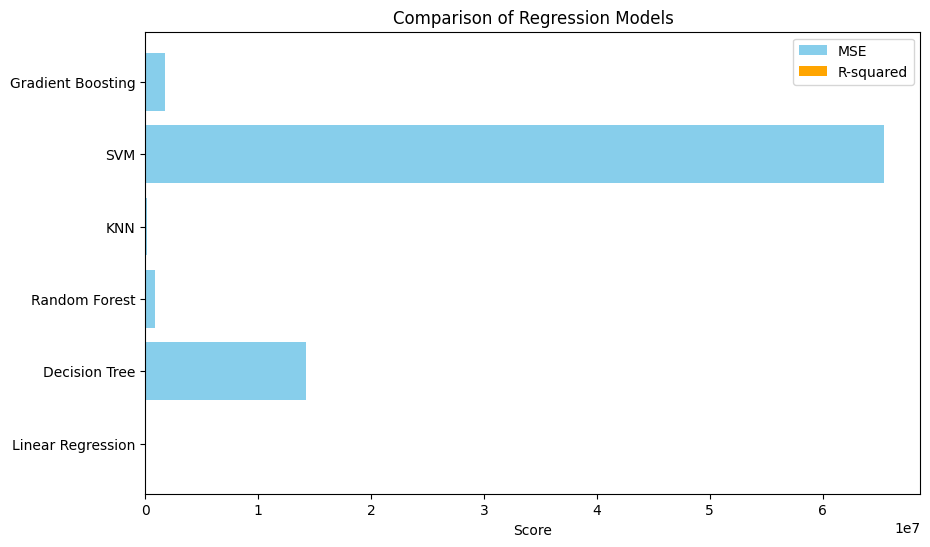

In [ ]:
import matplotlib.pyplot as plt

# Define the models and their corresponding scores
models = ['Linear Regression', 'Decision Tree', 'Random Forest', 'KNN', 'SVM', 'Gradient Boosting']
mse_scores = [2.41, 14228150.35, 807452.52, 146569.59, 65406833.86, 1730383.83]
r2_scores = [1, 0.78, 0.99, 0.99, 0.01, 0.97]

# Plot the bar plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot MSE scores
ax.barh(models, mse_scores, color='skyblue', label='MSE')
# Plot R-squared scores
ax.barh(models, r2_scores, color='orange', label='R-squared')

# Add labels and title
ax.set_xlabel('Score')
ax.set_title('Comparison of Regression Models')
ax.legend()

# Show the plot
plt.show()


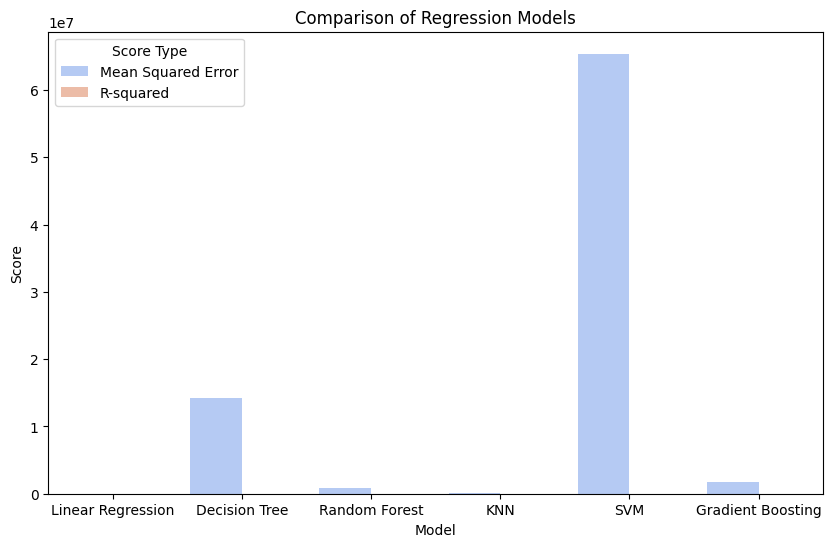

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the models and their corresponding scores
models = ['Linear Regression', 'Decision Tree', 'Random Forest', 'KNN', 'SVM', 'Gradient Boosting']
mse_scores = [2.41, 14228150.35, 807452.52, 146569.59, 65406833.86, 1730383.83]
r2_scores = [1, 0.78, 0.99, 0.99, 0.01, 0.97]

# Create a DataFrame for the scores
import pandas as pd
df = pd.DataFrame({'Model': models, 'Mean Squared Error': mse_scores, 'R-squared': r2_scores})

# Melt the DataFrame to make it suitable for Seaborn
df_melted = df.melt(id_vars='Model', var_name='Score Type', value_name='Score')

# Plot the bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x='Model', y='Score', hue='Score Type' , palette= 'coolwarm')
plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Comparison of Regression Models')
plt.legend(title='Score Type')
plt.show()


<ipython-input-48-278e2980888f>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_r2, x='Model', y='R-squared', palette='viridis')


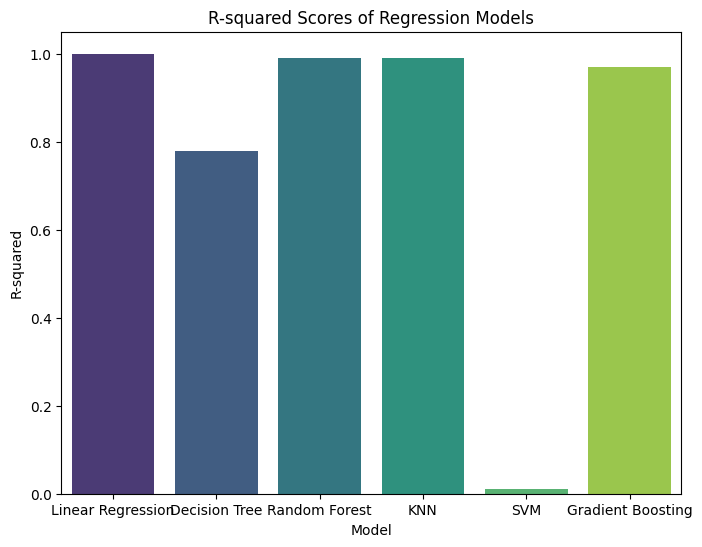

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the models and their corresponding R-squared scores
models = ['Linear Regression', 'Decision Tree', 'Random Forest', 'KNN', 'SVM', 'Gradient Boosting']
r2_scores = [1, 0.78, 0.99, 0.99, 0.01, 0.97]

# Create a DataFrame for the R-squared scores
import pandas as pd
df_r2 = pd.DataFrame({'Model': models, 'R-squared': r2_scores})

# Plot the bar plot for R-squared using Seaborn
plt.figure(figsize=(8, 6))
sns.barplot(data=df_r2, x='Model', y='R-squared', palette='viridis')
plt.xlabel('Model')
plt.ylabel('R-squared')
plt.title('R-squared Scores of Regression Models')

plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

models = ['Linear Regression', 'Decision Tree', 'Random Forest', 'KNN', 'SVM', 'Gradient Boosting']
y_test_actuals = [y_test_filtered, y_test_non_nan, y_test_non_nan, y_test_non_nan, y_test_non_nan, y_test_non_nan]
y_preds = [y_pred_filtered, y_pred_non_nan, y_pred_rf_no_nan, y_pred_knn_no_nan, y_pred_svm_no_nan, y_pred_gb_no_nan]

plt.figure(figsize=(20, 15))

for i, model in enumerate(models):
    plt.subplot(3, 2, i + 1)
    conf_matrix = confusion_matrix(y_test_actuals[i], y_preds[i])
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model}')

plt.tight_layout()
plt.show()


NameError: name 'y_test_filtered' is not defined

In [ ]:
pip install sweetviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 47.4 MB/s eta 0:00:00


In [ ]:
import sweetviz as sw
healthcare_asso = sw.analyze(data)
healthcare_asso.show_html('Healthcare_Associated_Infections.html')


                                             |          | [  0%]   00:00 -> (? left)

Report Healthcare_Associated_Infections.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
